In [249]:
import pandas as pd
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline
#for randomize data splitting
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

#to build linear Regression_model
import statsmodels.api as sm

#to check model performance
from sklearn.metrics import mean_absolute_error,mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import math

import warnings
warnings.filterwarnings('ignore')

# 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

In [250]:
#Problem 1
#1.1
df = pd.read_excel('compactiv.xlsx')

In [251]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [252]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [253]:
print("no. of rows: ",df.shape[0], "\n""no. of columns: ",df.shape[1])

no. of rows:  8192 
no. of columns:  22


In [254]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [255]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [256]:
df['runqsz'].value_counts()

Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64

In [257]:
#EDA
#Univaraite Analysis
#Numeric data

In [258]:
data_num = df.drop(['runqsz'],axis = 1)

lread
Skew : 13.9


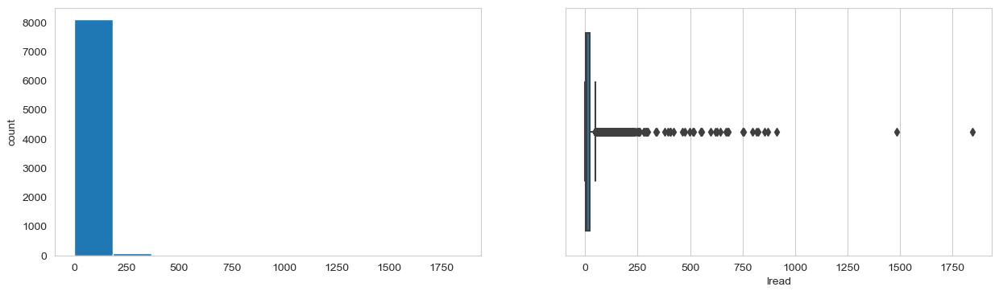

lwrite
Skew : 5.28


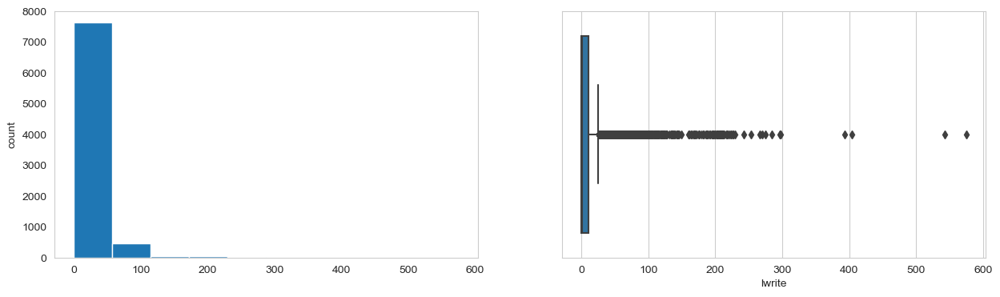

scall
Skew : 0.9


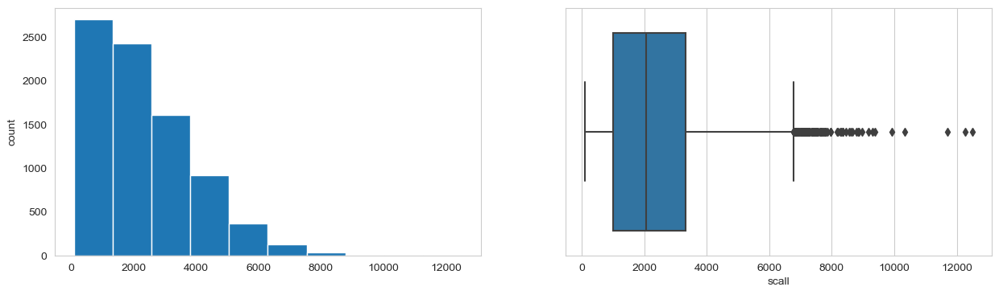

sread
Skew : 5.46


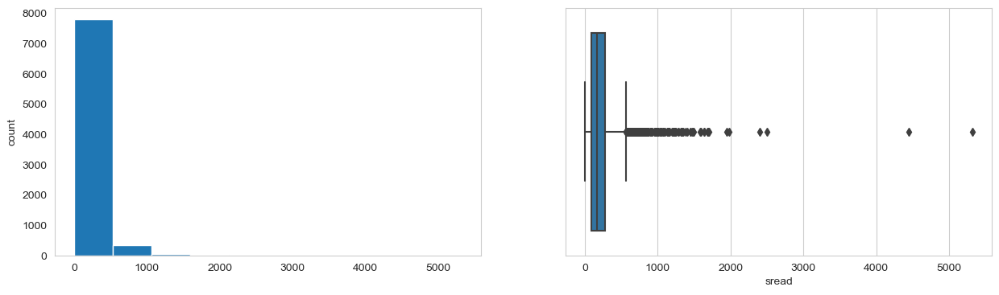

swrite
Skew : 9.61


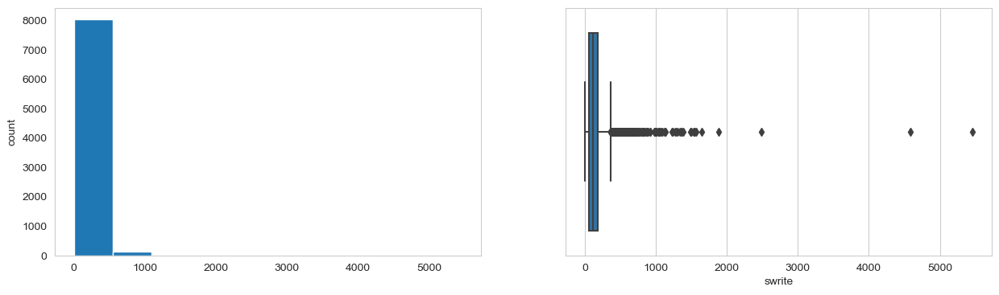

fork
Skew : 2.25


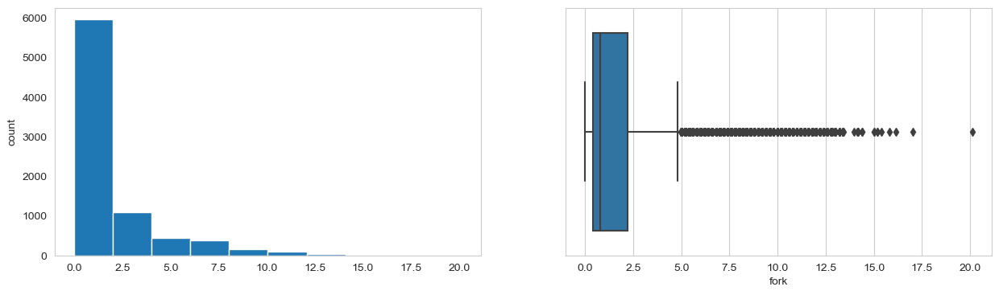

exec
Skew : 4.07


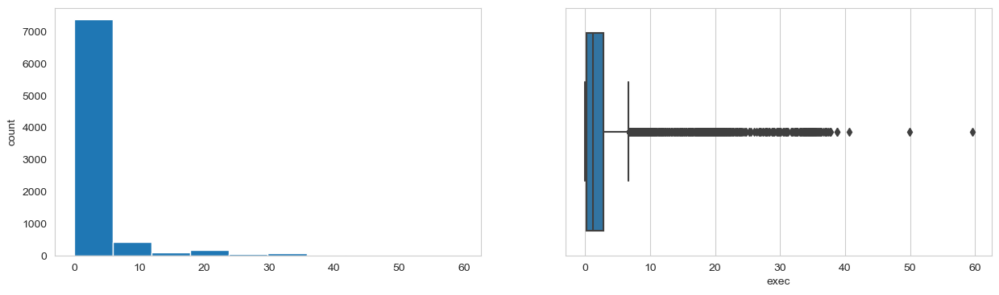

rchar
Skew : 2.85


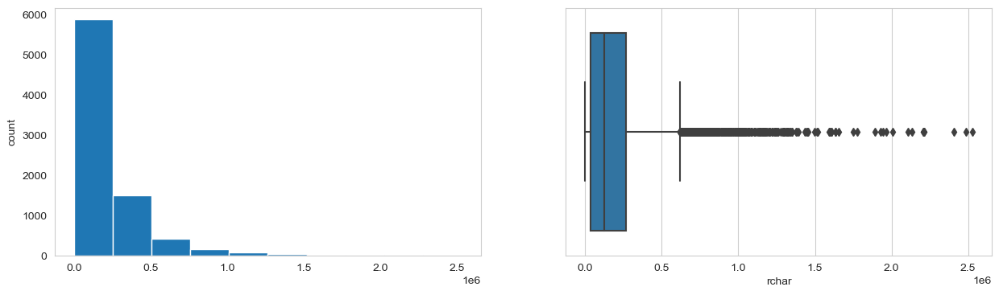

wchar
Skew : 3.85


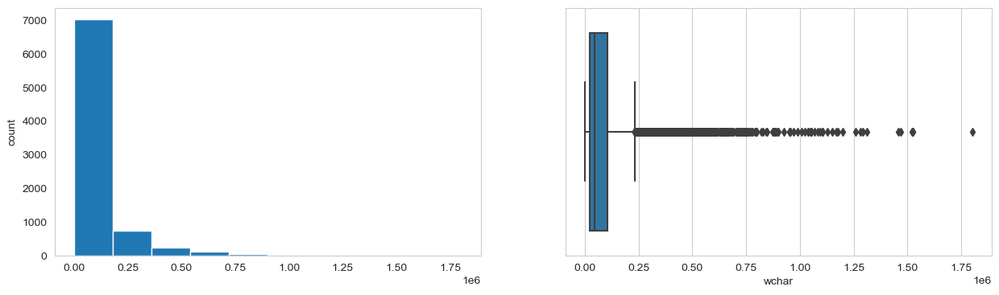

pgout
Skew : 5.07


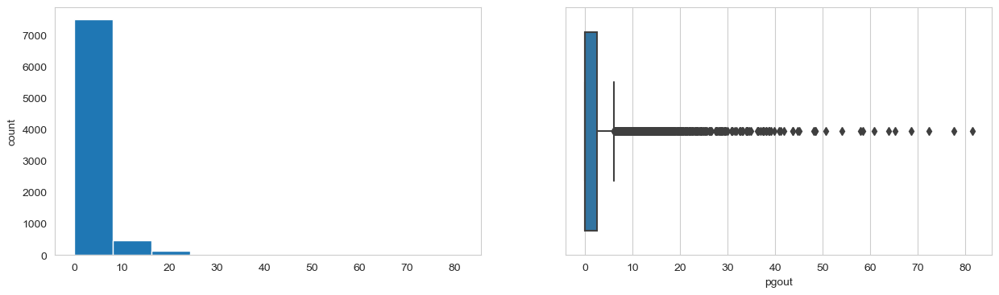

ppgout
Skew : 4.68


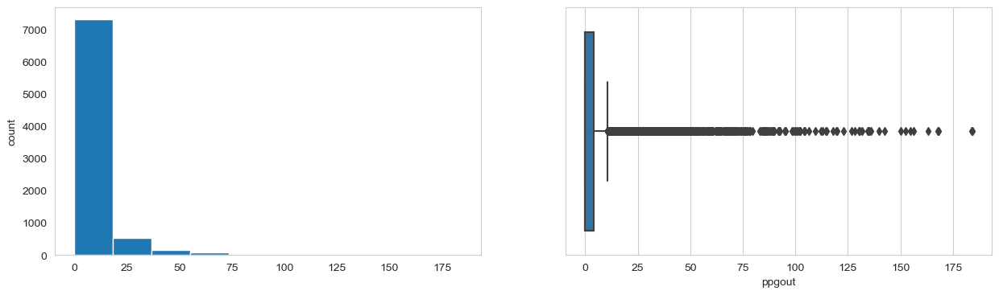

pgfree
Skew : 4.77


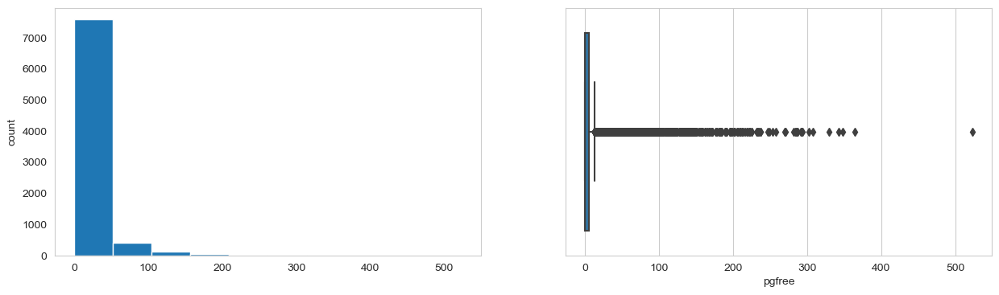

pgscan
Skew : 5.81


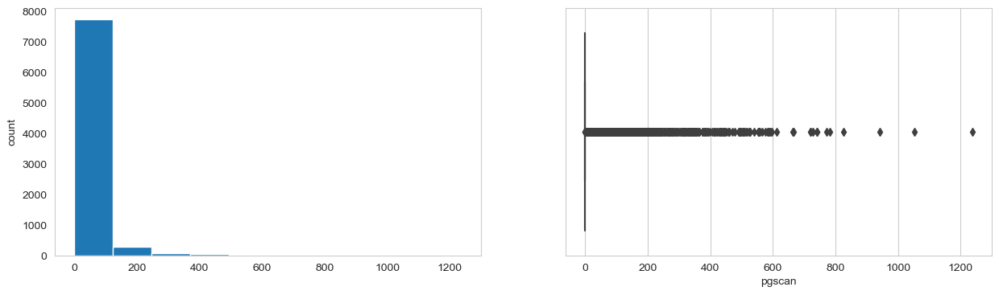

atch
Skew : 21.54


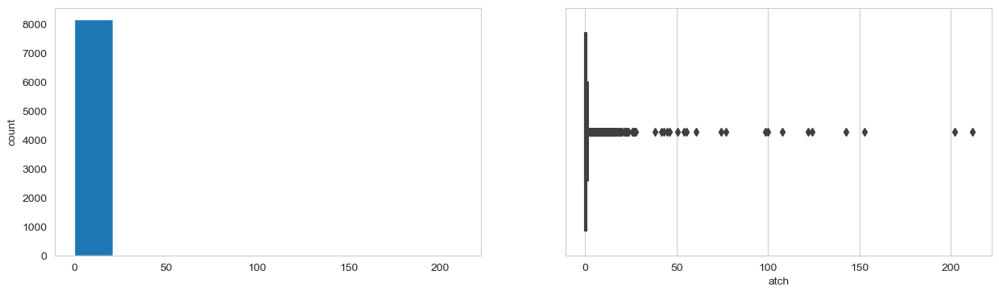

pgin
Skew : 3.24


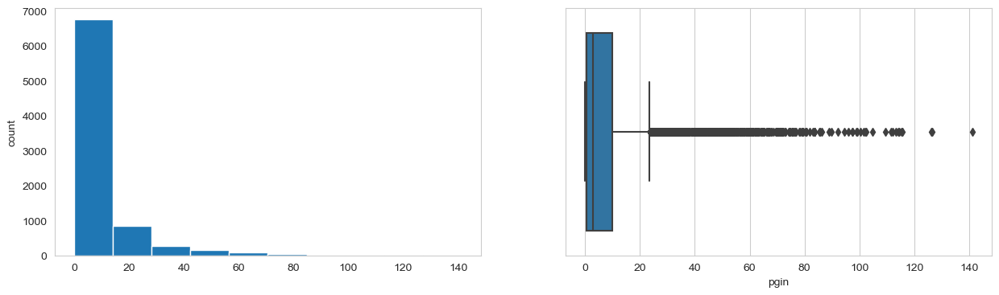

ppgin
Skew : 3.9


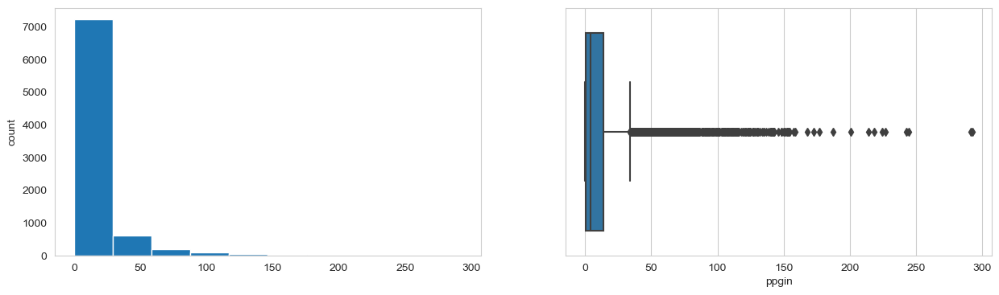

pflt
Skew : 1.72


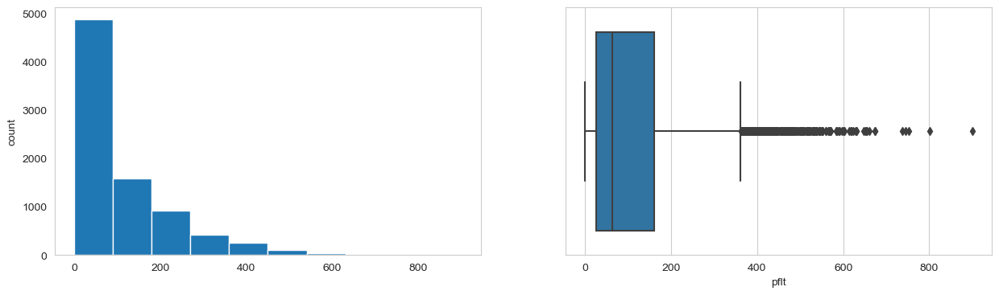

vflt
Skew : 1.74


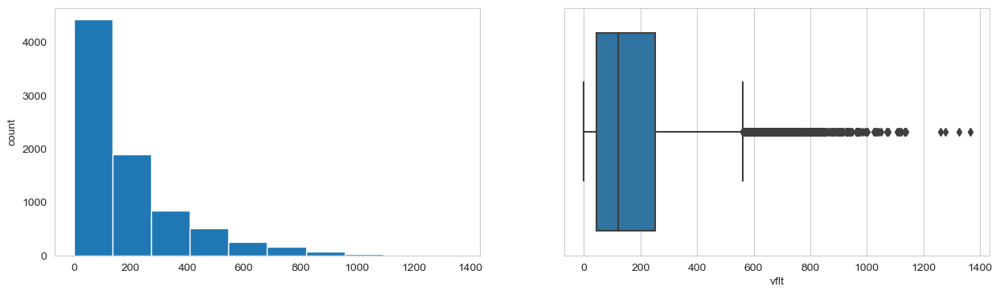

freemem
Skew : 1.81


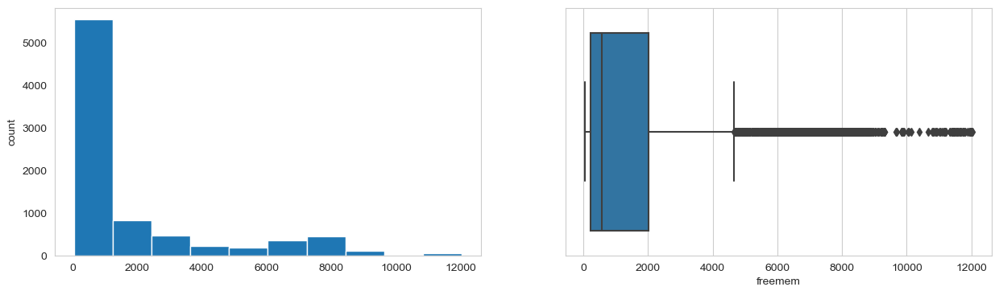

freeswap
Skew : -0.79


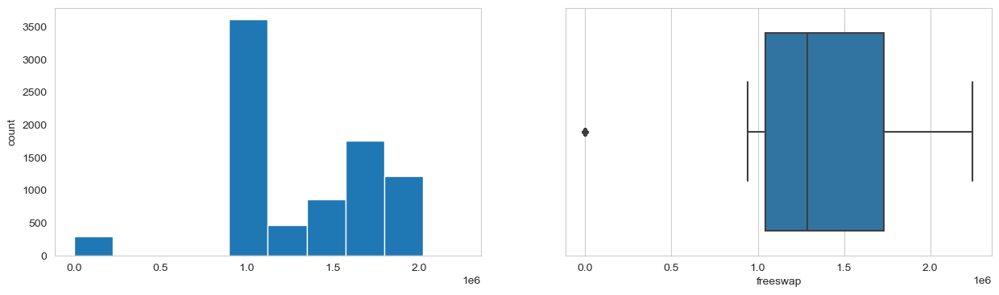

usr
Skew : -3.42


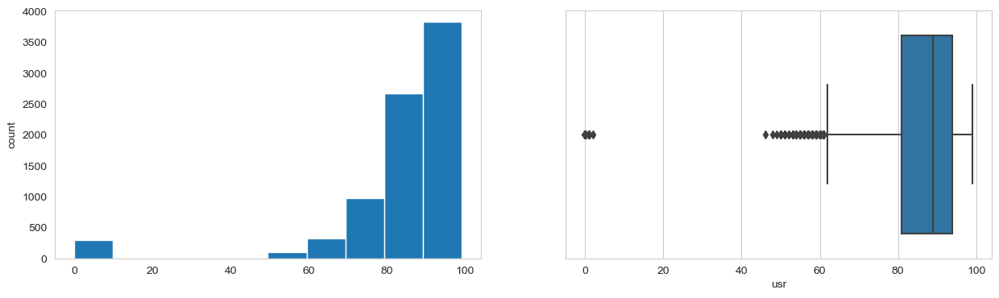

In [259]:
for col in data_num.columns[:]:
    print(col)
    print('Skew :',round(data_num[col].skew(),2))
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    data_num[col].hist(bins=10, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=data_num[col])
    plt.show()

In [260]:
#Categorical Data

<AxesSubplot:xlabel='runqsz', ylabel='count'>

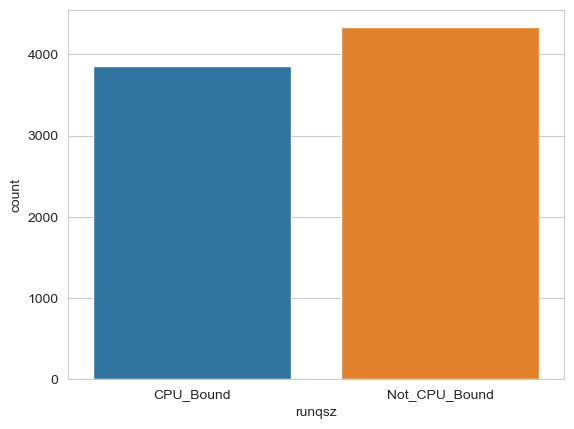

In [261]:
sns.countplot(x='runqsz',data=df)

In [262]:
#Bivariate 

In [263]:
#Numeric vs Numeric

Text(0, 0.5, 'pgout')

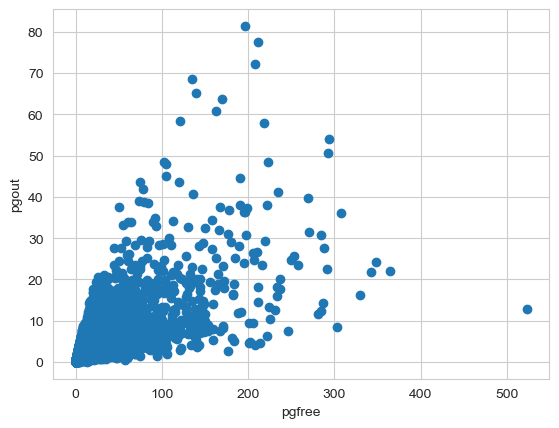

In [264]:
plt.scatter(x='pgfree',y='pgout',data=df)
plt.xlabel('pgfree',fontsize = 10)
plt.ylabel('pgout',fontsize = 10)

Text(0, 0.5, 'ppgout')

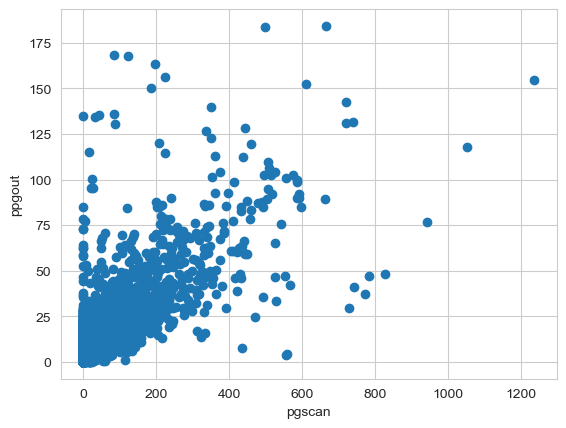

In [265]:
plt.scatter(x='pgscan',y='ppgout',data=df)
plt.xlabel('pgscan',fontsize = 10)
plt.ylabel('ppgout',fontsize = 10)

Text(0, 0.5, 'scall')

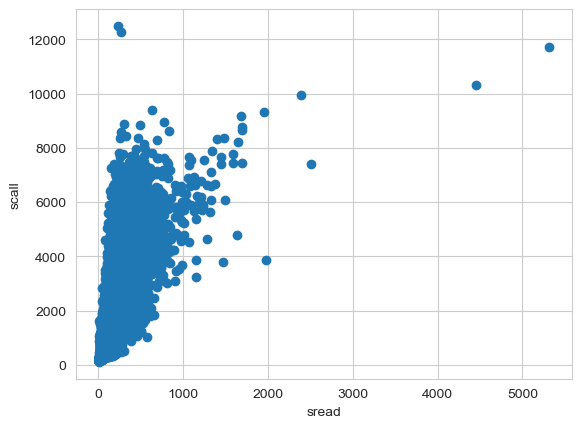

In [266]:
plt.scatter(x='sread',y='scall',data=df)
plt.xlabel('sread')
plt.ylabel('scall')

Text(0, 0.5, 'usr')

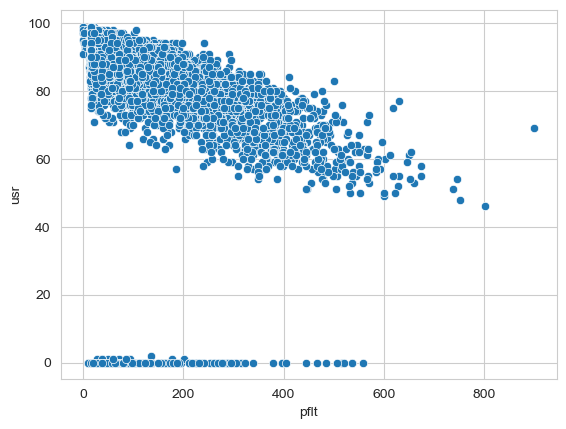

In [267]:
sns.scatterplot(x='pflt',y='usr',data=df)
plt.xlabel('pflt')
plt.ylabel('usr')

Text(0, 0.5, 'scall')

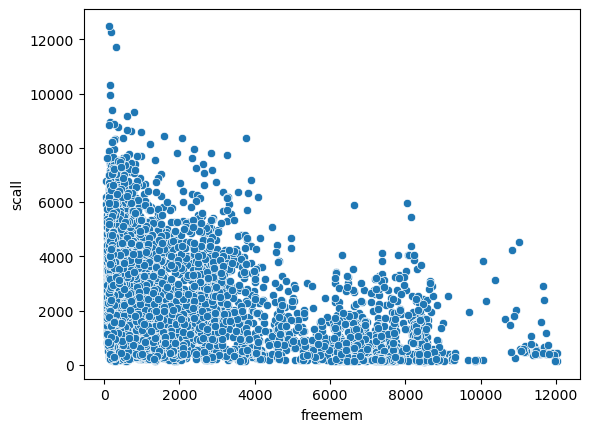

In [98]:
sns.scatterplot(x='freemem',y='scall',data=df)
plt.xlabel('freemem')
plt.ylabel('scall')

In [99]:
#Multivariate

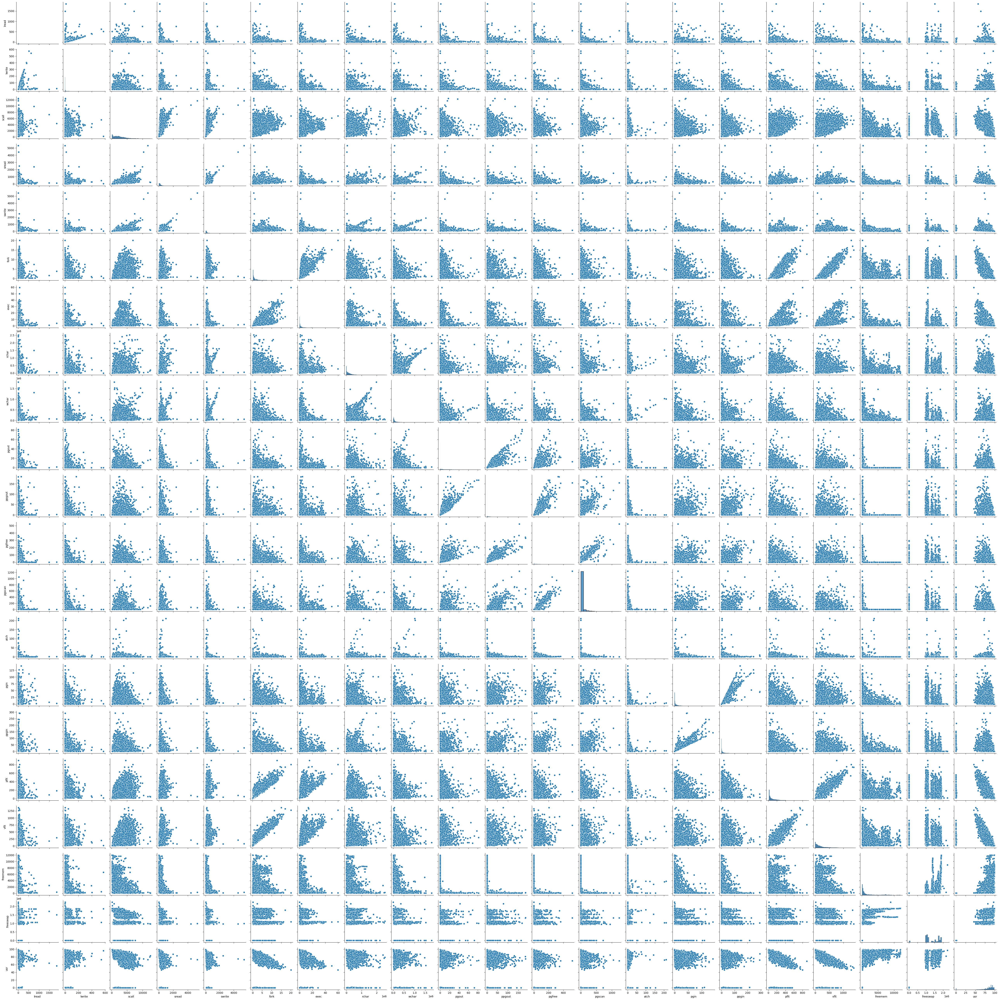

In [100]:
sns.pairplot(data_num);

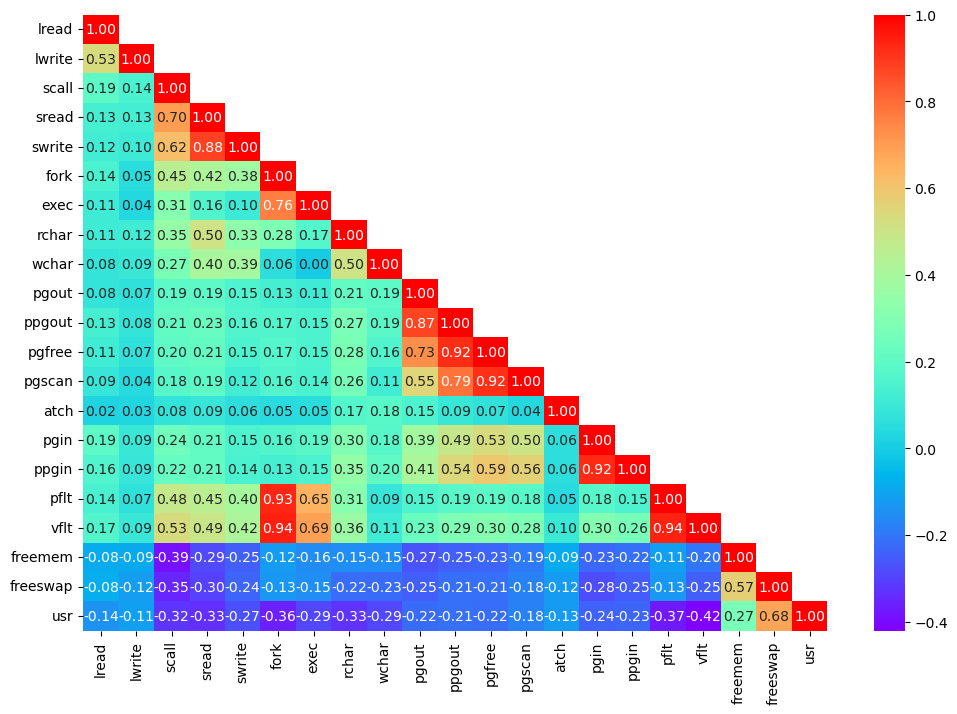

In [101]:
plt.figure(figsize=(12,8))
sns.heatmap(data_num.corr(),annot=True,fmt='.2f',cmap='rainbow',mask=np.triu(data_num.corr(),+1))
plt.show()

# 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [102]:
#Problem 1
#1.2

In [103]:
df.duplicated().sum()

0

In [104]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [106]:
df.median()

lread             7.0
lwrite            1.0
scall          2051.5
sread           166.0
swrite          117.0
fork              0.8
exec              1.2
rchar        125473.5
wchar         46619.0
pgout             0.0
ppgout            0.0
pgfree            0.0
pgscan            0.0
atch              0.0
pgin              2.8
ppgin             3.8
pflt             63.8
vflt            120.4
freemem         579.0
freeswap    1289289.5
usr              89.0
dtype: float64

In [107]:
medianfiller = lambda x: x.fillna(x.median())
data_num = data_num.apply(medianfiller,axis = 0)

In [108]:
data_num.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
freemem     0
freeswap    0
usr         0
dtype: int64

lread
Skew: 13.9


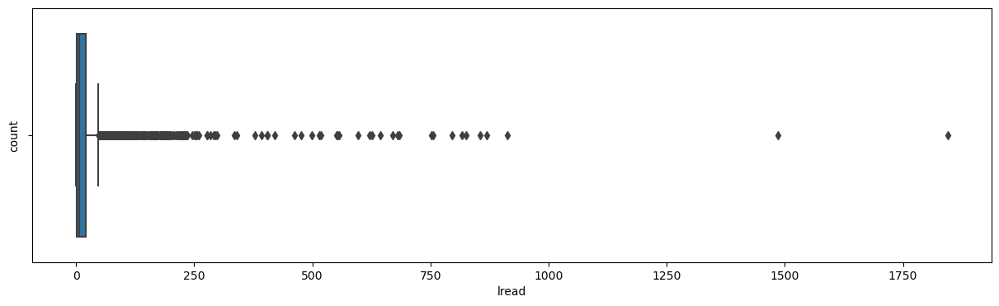

lwrite
Skew: 5.28


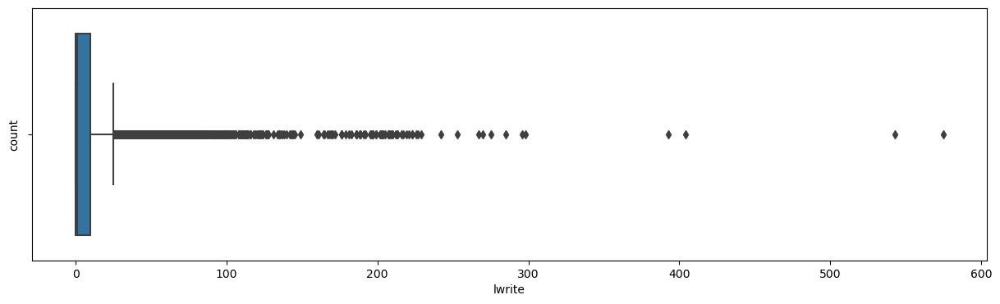

scall
Skew: 0.9


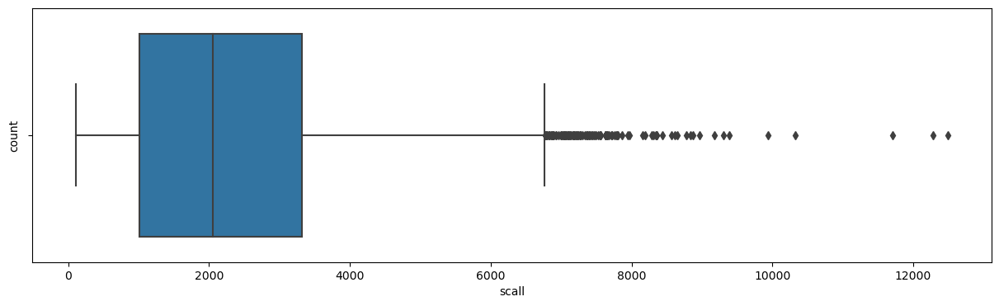

sread
Skew: 5.46


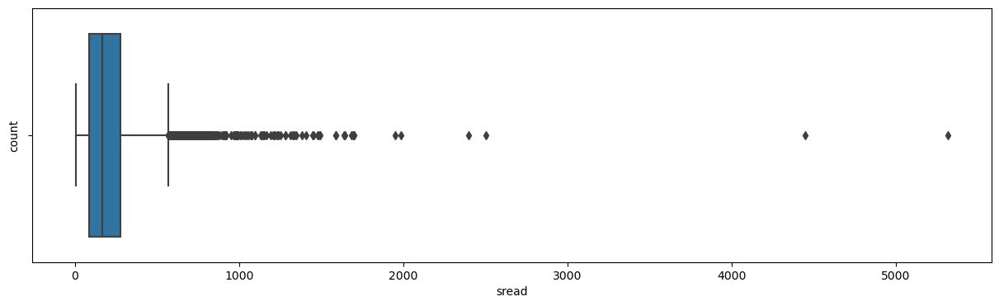

swrite
Skew: 9.61


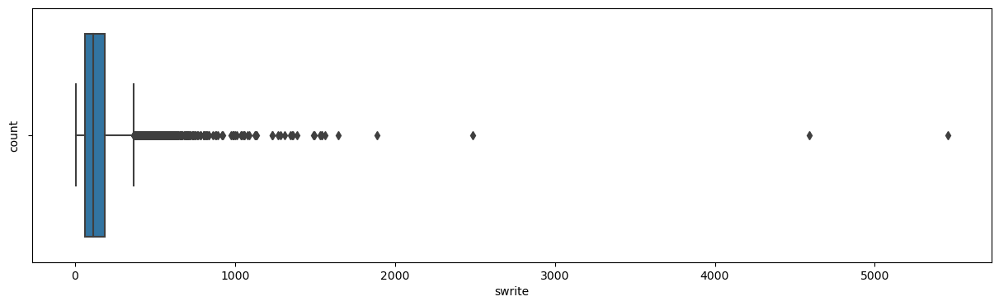

fork
Skew: 2.25


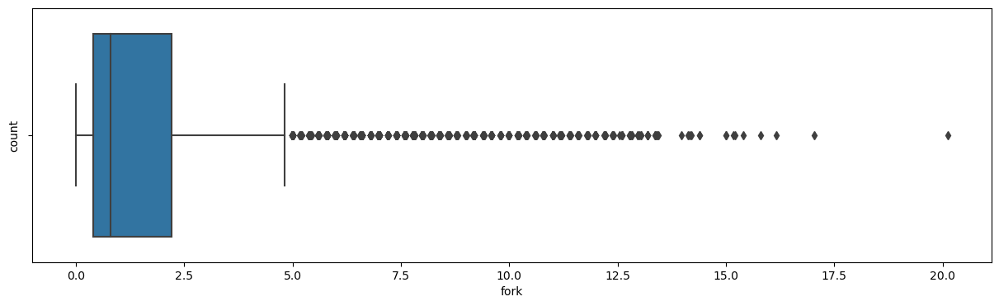

exec
Skew: 4.07


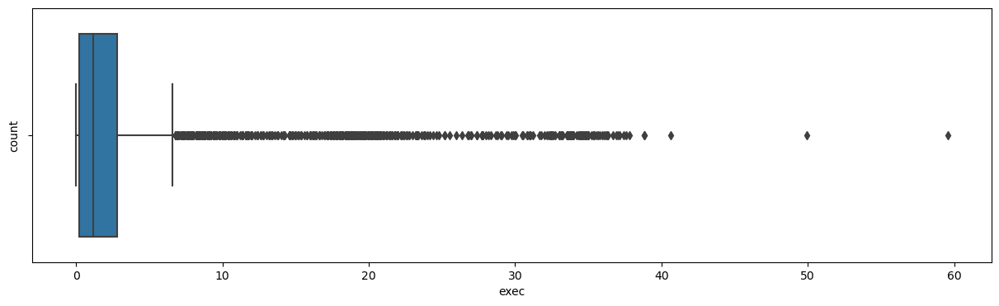

rchar
Skew: 2.88


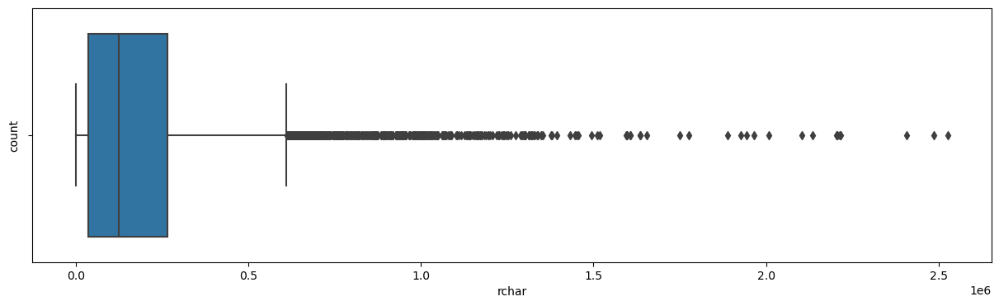

wchar
Skew: 3.85


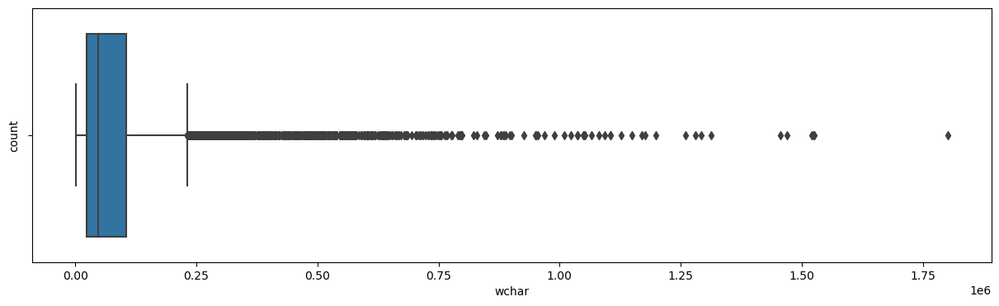

pgout
Skew: 5.07


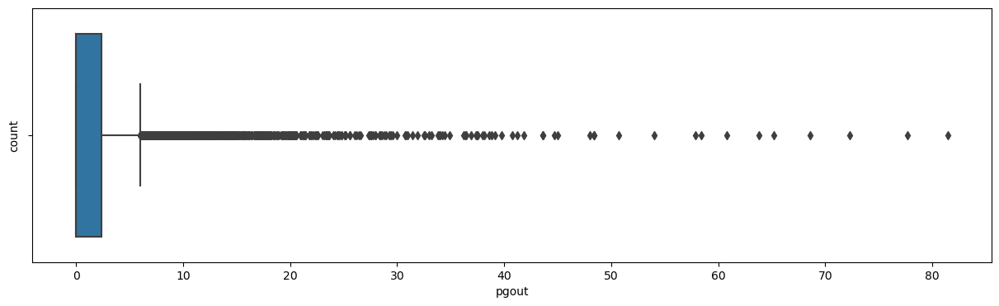

ppgout
Skew: 4.68


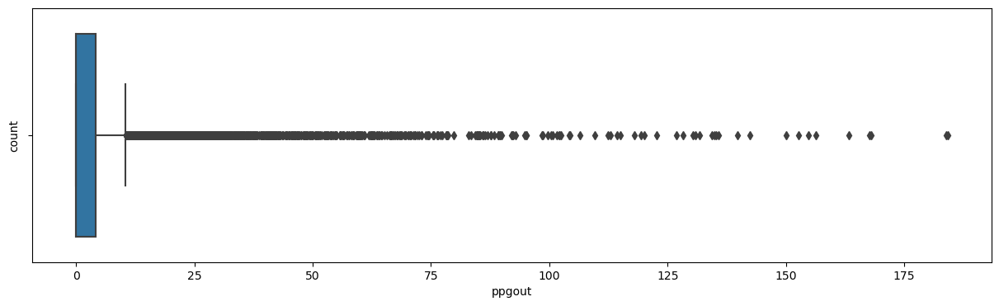

pgfree
Skew: 4.77


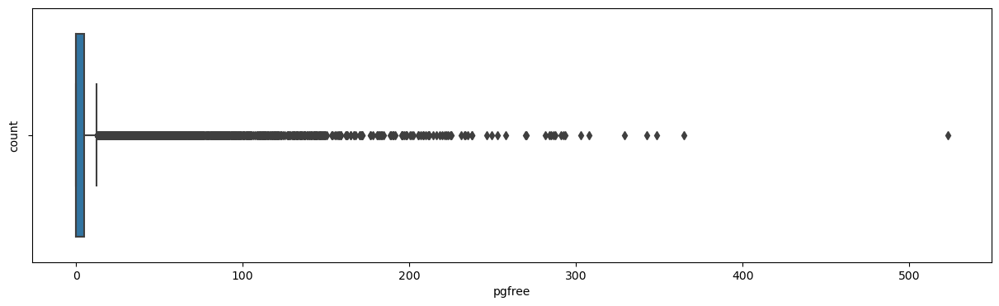

pgscan
Skew: 5.81


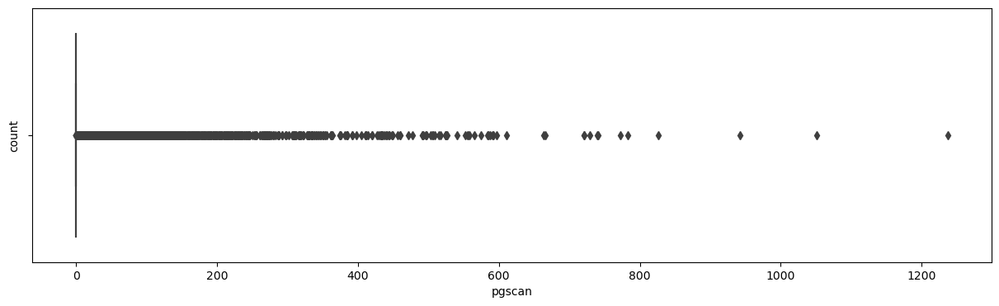

atch
Skew: 21.54


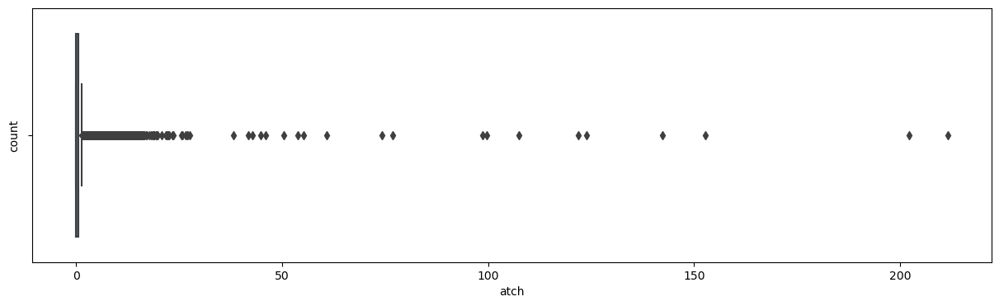

pgin
Skew: 3.24


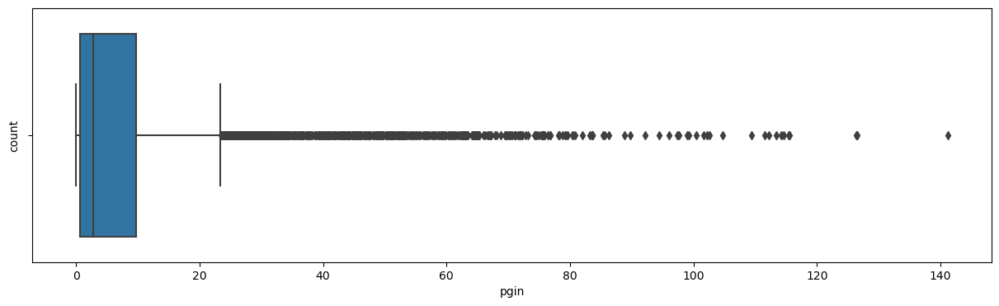

ppgin
Skew: 3.9


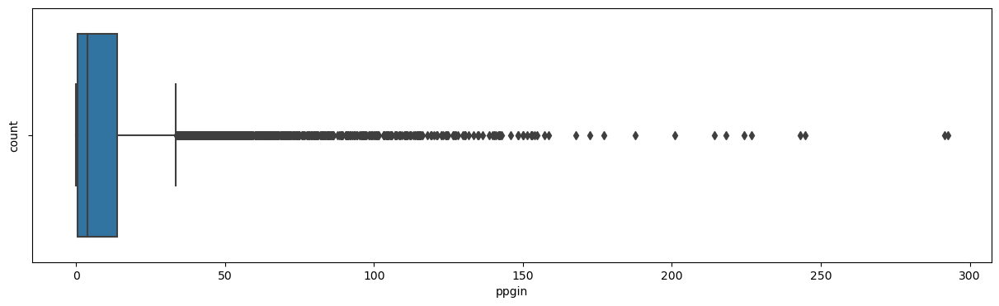

pflt
Skew: 1.72


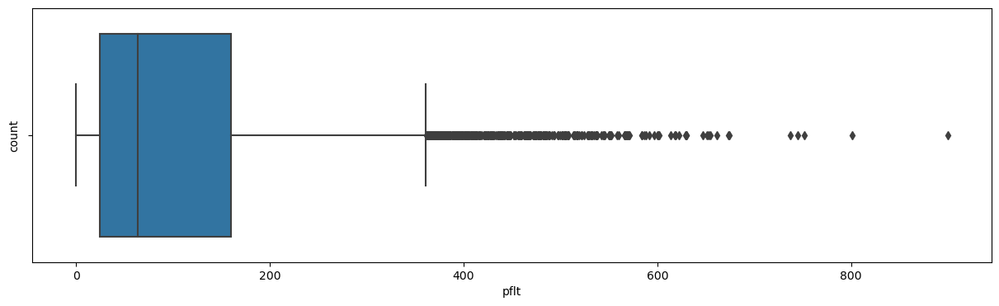

vflt
Skew: 1.74


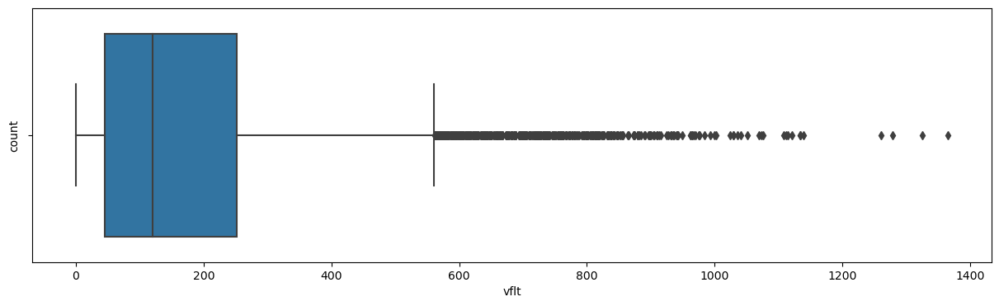

freemem
Skew: 1.81


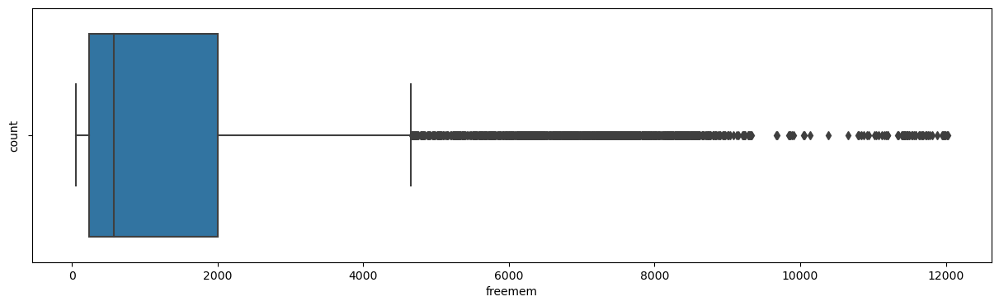

freeswap
Skew: -0.79


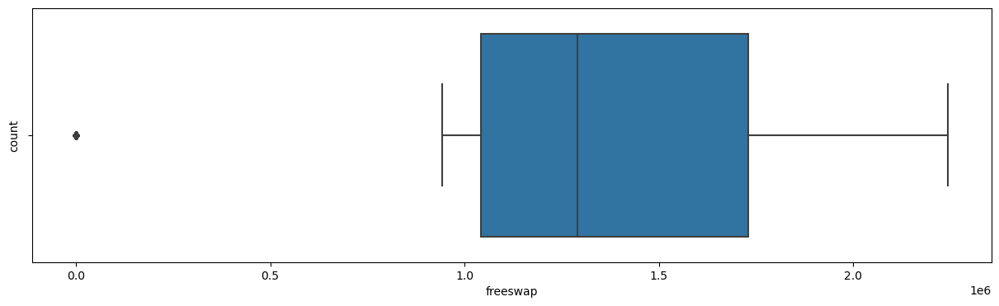

usr
Skew: -3.42


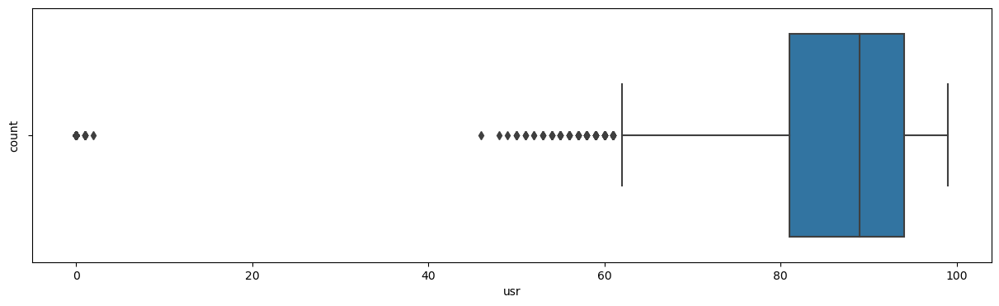

In [109]:
#checking for Outliers
for col in data_num.columns[:]:
    print(col)
    print('Skew:',round(data_num[col].skew(),2))
    plt.figure(figsize = (15,4))
    plt.ylabel('count')
    sns.boxplot(x=data_num[col])
    plt.show()

In [110]:
def remove_outliers(col):
    sorted(col)
    Q1,Q3 = np.percentile(col,[25,75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5 * IQR)
    upper_range = Q3 +(1.5 * IQR)
    return lower_range,upper_range

In [111]:
for column in data_num.columns[:]:
    lr, ur = remove_outliers(data_num[column])
    data_num[column] = np.where(data_num[column] > ur,ur,data_num[column])
    data_num[column] = np.where(data_num[column] < lr,lr,data_num[column])
    plt.show()
    print(column)

lread
lwrite
scall
sread
swrite
fork
exec
rchar
wchar
pgout
ppgout
pgfree
pgscan
atch
pgin
ppgin
pflt
vflt
freemem
freeswap
usr


lread
Skew: 1.19


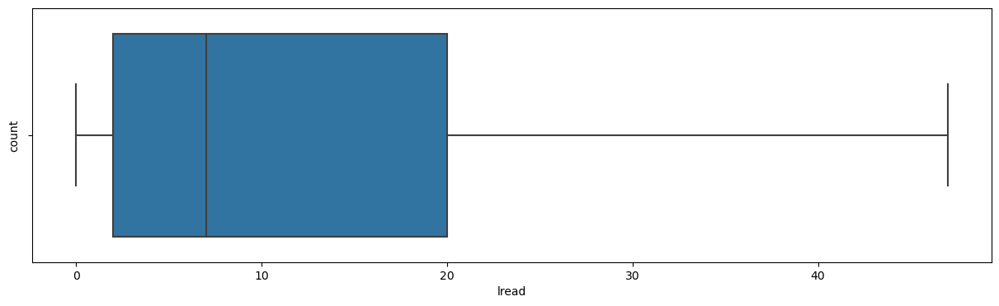

lwrite
Skew: 1.21


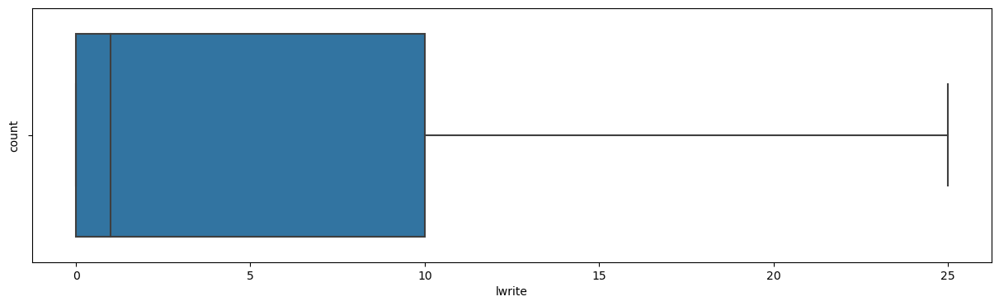

scall
Skew: 0.72


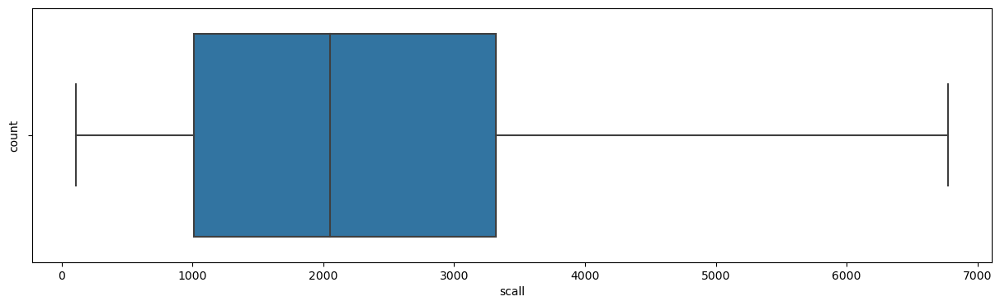

sread
Skew: 0.93


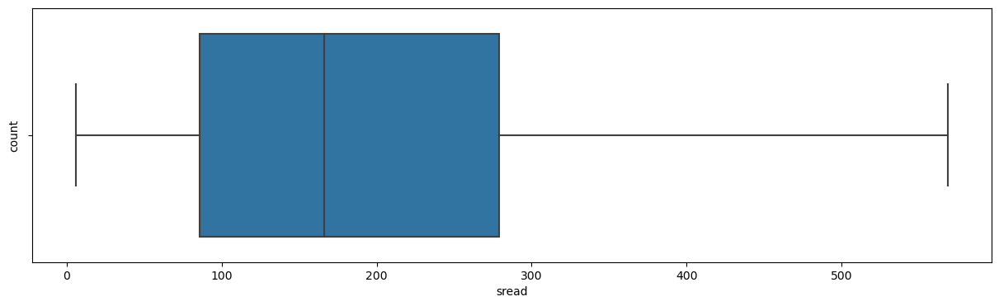

swrite
Skew: 0.94


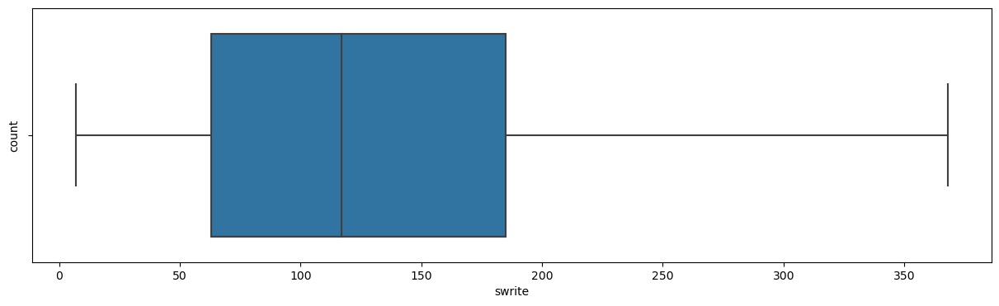

fork
Skew: 1.11


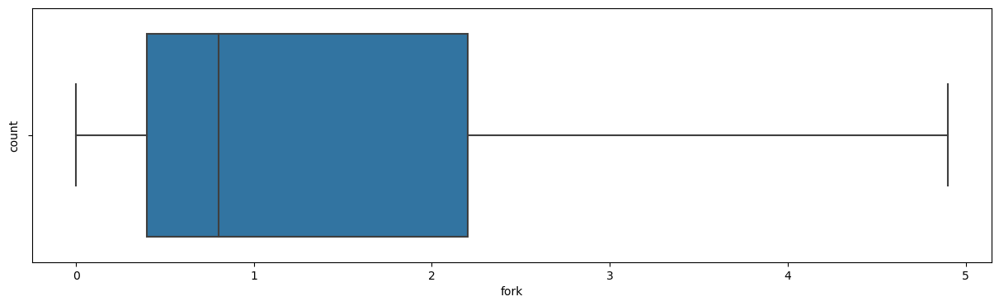

exec
Skew: 1.25


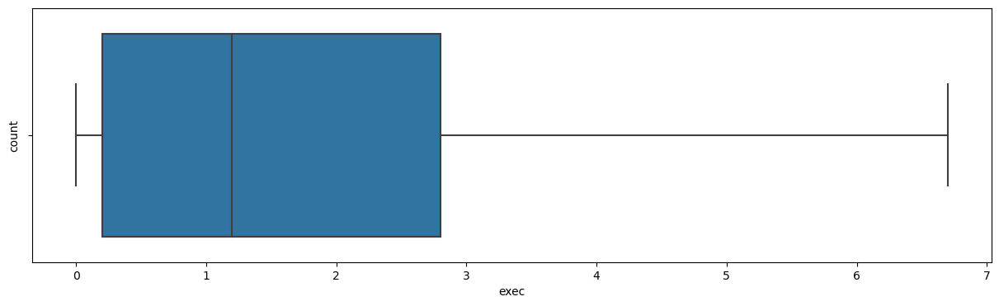

rchar
Skew: 1.12


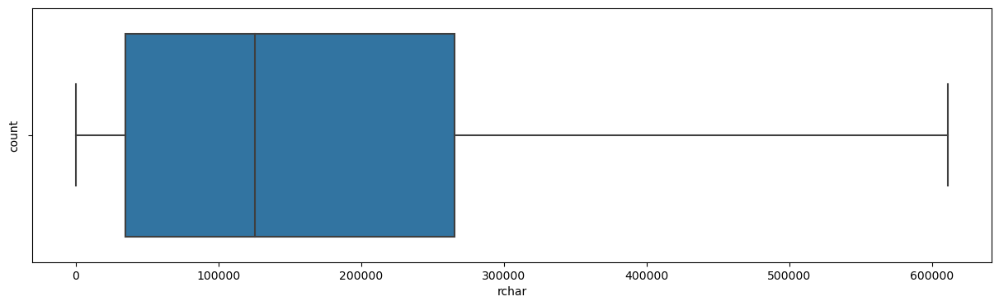

wchar
Skew: 1.15


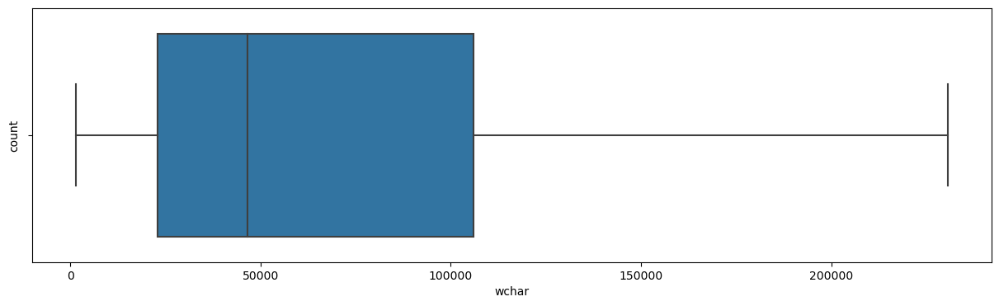

pgout
Skew: 1.25


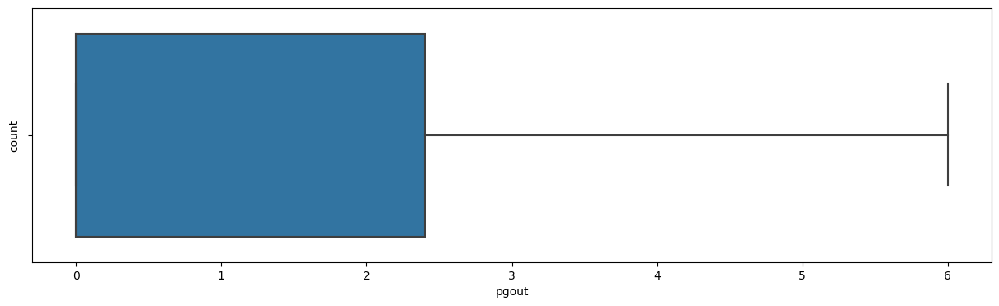

ppgout
Skew: 1.23


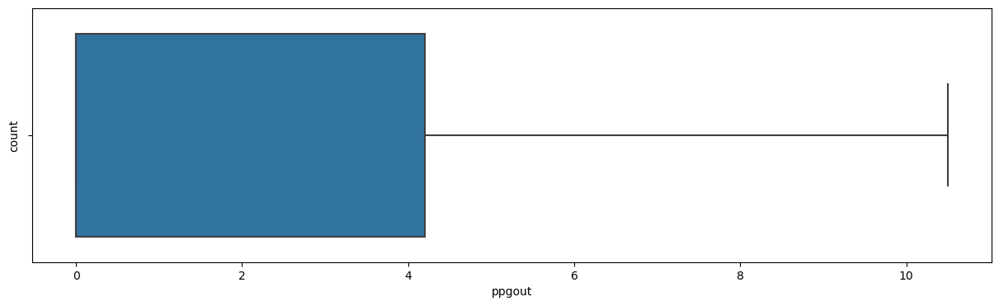

pgfree
Skew: 1.18


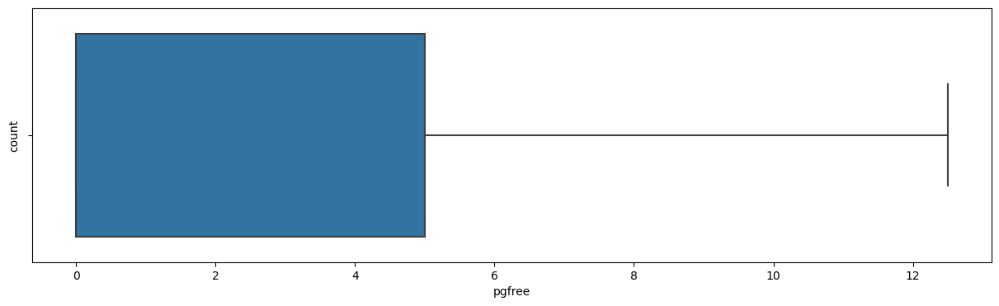

pgscan
Skew: 0


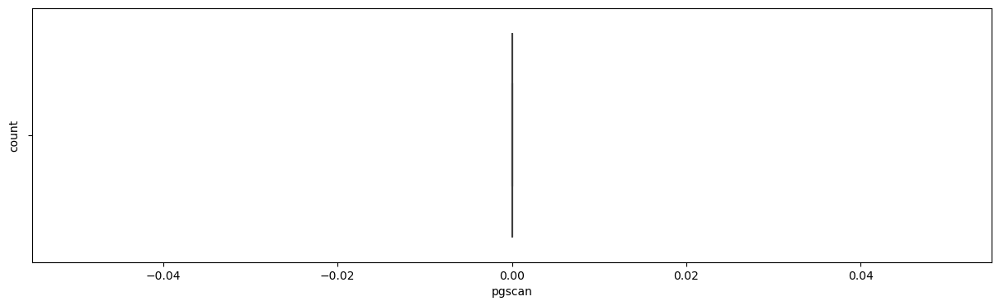

atch
Skew: 1.15


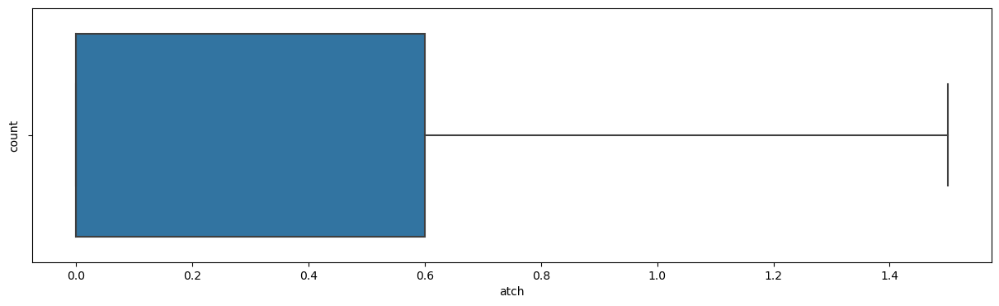

pgin
Skew: 1.22


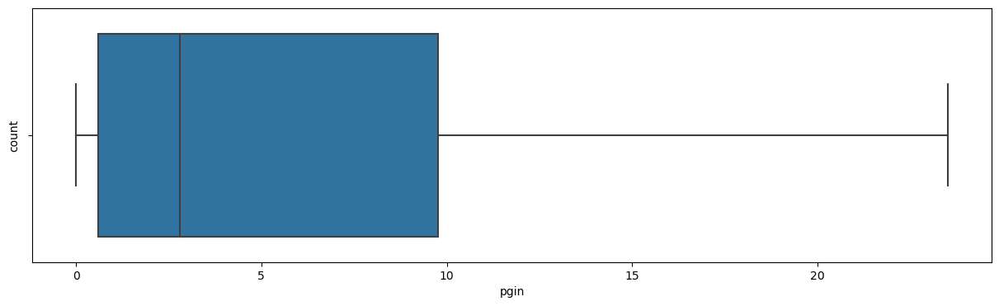

ppgin
Skew: 1.2


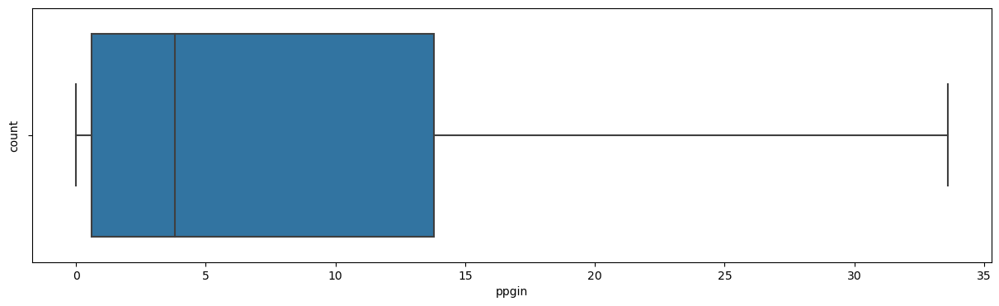

pflt
Skew: 1.2


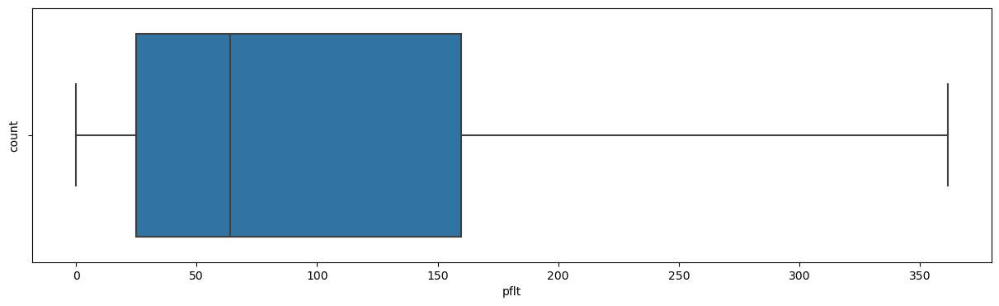

vflt
Skew: 1.1


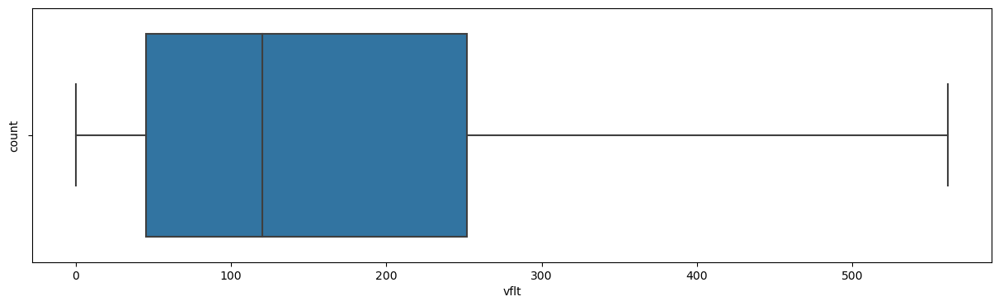

freemem
Skew: 1.21


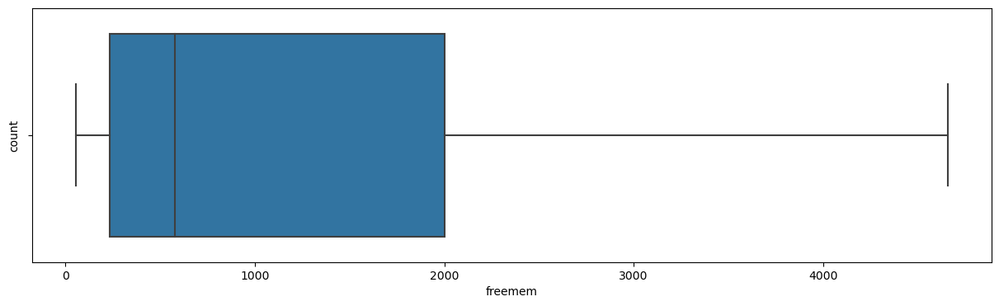

freeswap
Skew: -0.77


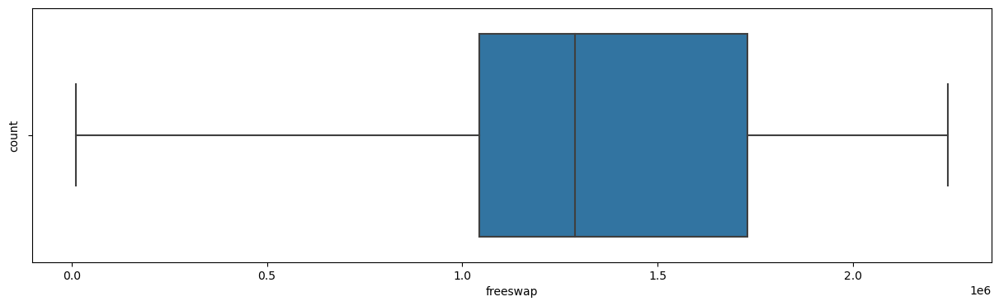

usr
Skew: -1.07


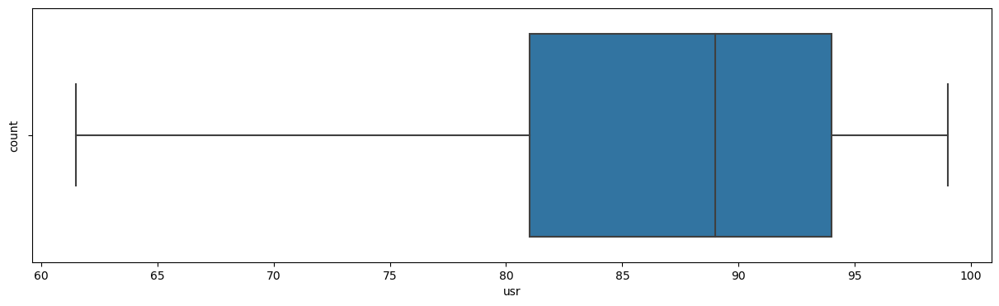

In [112]:
#checking if outliers are treated
for col in data_num.columns[:]:
    print(col)
    print('Skew:',round(data_num[col].skew(),2))
    plt.figure(figsize = (15,4))
    plt.ylabel('count')
    sns.boxplot(x=data_num[col])
    plt.show()

In [113]:
data_cat = df['runqsz']

In [114]:
df = pd.concat([data_num,data_cat],axis= 1, join = 'inner')
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95.0,CPU_Bound
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97.0,Not_CPU_Bound
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87.0,Not_CPU_Bound
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98.0,Not_CPU_Bound
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90.0,Not_CPU_Bound


# 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

In [115]:
#Problem 1
#1.3

In [116]:
#Encoding for object variable 

In [117]:
df = pd.get_dummies(df, columns = ['runqsz'])

In [118]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95.0,1,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97.0,0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87.0,0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98.0,0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90.0,0,1


In [119]:
X = df.drop('usr',axis = 1) # copying the predictors into X dataframe
y = df[['usr']] # copy target into y dataframe

In [120]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,1,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,0,1


In [121]:
y.head()

,usr
0,95.0
1,97.0
2,87.0
3,98.0
4,90.0


In [122]:
#spliting the data into 70:30 ratio, 30 in test and 70 in train

In [123]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.30, random_state = 1)

In [124]:
print(X_train.shape)

(5734, 22)


In [125]:
print(X_test.shape)

(2458, 22)


In [126]:
print(y_train.shape)

(5734, 1)


In [127]:
print(y_test.shape)

(2458, 1)


# Using Linear Model from Sci-kit learn library

In [128]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [129]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.06348150618192089
The coefficient for lwrite is 0.0481612870912416
The coefficient for scall is -0.0006638280111677398
The coefficient for sread is 0.00030825210314620806
The coefficient for swrite is -0.005421822297634897
The coefficient for fork is 0.029312727248643738
The coefficient for exec is -0.321166483898222
The coefficient for rchar is -5.1668417594787055e-06
The coefficient for wchar is -5.40287523542752e-06
The coefficient for pgout is -0.3688190638729598
The coefficient for ppgout is -0.07659768212742389
The coefficient for pgfree is 0.0844841447056167
The coefficient for pgscan is -2.220446049250313e-16
The coefficient for atch is 0.6275741574822401
The coefficient for pgin is 0.01998790767865954
The coefficient for ppgin is -0.06733383975700165
The coefficient for pflt is -0.03360282937752517
The coefficient for vflt is -0.005463668798516129
The coefficient for freemem is -0.0004584671879462989
The coefficient for freeswap is 8.83184026302

In [130]:
# Let us explore the coefficients for each of the independent attributes of test data

for idx, col_name in enumerate(X_test.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.06348150618192089
The coefficient for lwrite is 0.0481612870912416
The coefficient for scall is -0.0006638280111677398
The coefficient for sread is 0.00030825210314620806
The coefficient for swrite is -0.005421822297634897
The coefficient for fork is 0.029312727248643738
The coefficient for exec is -0.321166483898222
The coefficient for rchar is -5.1668417594787055e-06
The coefficient for wchar is -5.40287523542752e-06
The coefficient for pgout is -0.3688190638729598
The coefficient for ppgout is -0.07659768212742389
The coefficient for pgfree is 0.0844841447056167
The coefficient for pgscan is -2.220446049250313e-16
The coefficient for atch is 0.6275741574822401
The coefficient for pgin is 0.01998790767865954
The coefficient for ppgin is -0.06733383975700165
The coefficient for pflt is -0.03360282937752517
The coefficient for vflt is -0.005463668798516129
The coefficient for freemem is -0.0004584671879462989
The coefficient for freeswap is 8.83184026302

In [131]:
# Let us check the intercept for the model

intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 84.92938971974552


In [132]:
# R square on training data
print('R square for training data:',regression_model.score(X_train, y_train))

R square for training data: 0.7961086101274572


In [134]:
# R square on testing data
print('R square for testing data:',regression_model.score(X_test, y_test))

R square for testing data: 0.7677318597936018


In [135]:
from sklearn import metrics

In [140]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
print('RMSE for training data:',np.sqrt(metrics.mean_squared_error(y_train,predicted_train)))

RMSE for training data: 4.419536092979902


In [141]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
print('RMSE for testing data:',np.sqrt(metrics.mean_squared_error(y_test,predicted_test)))

RMSE for testing data: 4.652295704192754


In [138]:
#getting score on training data
print('The coefficient of determination R^2 of the prediction on Train set',regression_model.score(X_train, y_train))

The coefficient of determination R^2 of the prediction on Train set 0.7961086101274572


In [142]:
#getting score on testing data
print('The coefficient of determination R^2 of the prediction on Test set',regression_model.score(X_test, y_test))

The coefficient of determination R^2 of the prediction on Test set 0.7677318597936018


# Using Statsmodels OLS

In [143]:
#lets add intercept to the data
X_stat = sm.add_constant(X)

In [144]:
X_trainst, X_testst, y_trainst, y_testst = train_test_split(X_stat, y, test_size=0.30 , random_state=1)

In [145]:
X_trainst.head()

,const,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
694,1.0,1.0,1.0,1345.0,223.0,192.0,0.6,0.6,198703.0,230625.875,...,0.0,1.5,3.80,7.40,28.20,56.60,121.0,1375446.0,1,0
5535,1.0,1.0,1.0,1429.0,87.0,67.0,0.2,0.2,7163.0,24842.000,...,0.0,0.0,1.60,1.60,15.77,30.74,1476.0,1021541.0,0,1
4244,1.0,47.0,25.0,3273.0,225.0,180.0,0.6,0.4,83246.0,53705.000,...,0.0,1.5,3.99,4.59,59.88,74.05,82.0,10989.5,1,0
2472,1.0,13.0,8.0,4349.0,300.0,191.0,2.8,3.0,96009.0,70467.000,...,0.0,0.0,2.80,3.20,129.00,236.80,772.0,993909.0,1,0
7052,1.0,17.0,23.0,225.0,13.0,13.0,0.4,1.6,17132.0,12514.000,...,0.0,0.0,0.00,0.00,19.80,23.80,4179.0,1821682.0,0,1


In [146]:
y_trainst.head()

,usr
694,91.0
5535,94.0
4244,61.5
2472,83.0
7052,94.0


In [241]:
#for test data
olsmod_test = sm.OLS(y_testst,X_testst)
olsres_test = olsmod.fit()
print(olsres_test.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     415.5
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        10:06:49   Log-Likelihood:                -7237.0
No. Observations:                2458   AIC:                         1.452e+04
Df Residuals:                    2437   BIC:                         1.464e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   55.0480 

In [147]:
#for training data
olsmod = sm.OLS(y_trainst,X_trainst)
olsres = olsmod.fit()

In [148]:
#lets print regression summary
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1115.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:53:58   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5713   BIC:                         3.350e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   56.6196 

In [ ]:
#lets check the VIF of the predictors

In [149]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series([variance_inflation_factor(X_trainst.values,i) for i in range(X_trainst.shape[1])],
                        index = X_trainst.columns,)

print('VIF values: \n\n{}\n'.format(vif_series1))

VIF values: 

const                    0.000000
lread                    5.350560
lwrite                   4.328397
scall                    2.960609
sread                    6.420172
swrite                   5.597135
fork                    13.035359
exec                     3.241417
rchar                    2.133616
wchar                    1.584381
pgout                   11.360363
ppgout                  29.404223
pgfree                  16.496748
pgscan                        NaN
atch                     1.875901
pgin                    13.809339
ppgin                   13.951855
pflt                    12.001460
vflt                    15.971049
freemem                  1.961304
freeswap                 1.841239
runqsz_CPU_Bound              inf
runqsz_Not_CPU_Bound          inf
dtype: float64



In [ ]:
#lets remove multicollinear columns one by one and observe effect on our predictive model

In [150]:
X_train2 = X_trainst.drop(['runqsz_CPU_Bound'],axis = 1)
olsmod_1 = sm.OLS(y_trainst, X_train2)
olsres_1 = olsmod_1.fit()
print(
        "R-squared:",
           np.round(olsres_1.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_1.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [151]:
#there is no change in values of R sq and Adj R sqr on dropping runqsz_CPU_Bound.

In [152]:
X_train3 = X_trainst.drop(['runqsz_Not_CPU_Bound'],axis = 1)
olsmod_2 = sm.OLS(y_trainst, X_train3)
olsres_2 = olsmod_2.fit()
print(
        "R-squared:",
           np.round(olsres_2.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_2.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [153]:
#there is no change in values of R sq and Adj R sqr on dropping runqsz_Not_CPU_Bound.

In [154]:
X_train4 = X_trainst.drop(['ppgout'],axis = 1)
olsmod_3 = sm.OLS(y_trainst, X_train4)
olsres_3 = olsmod_3.fit()
print(
        "R-squared:",
           np.round(olsres_3.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_3.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [155]:
#there is no change in values of R sq and Adj R sqr on dropping ppgout.

In [156]:
X_train5 = X_trainst.drop(['pgfree'],axis = 1)
olsmod_4 = sm.OLS(y_trainst, X_train5)
olsres_4 = olsmod_4.fit()
print(
        "R-squared:",
           np.round(olsres_4.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_4.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [157]:
#there is no change in values of R sq and Adj R sqr on dropping pgfree.

In [158]:
X_train6 = X_trainst.drop(['vflt'],axis = 1)
olsmod_5 = sm.OLS(y_trainst, X_train6)
olsres_5 = olsmod_5.fit()
print(
        "R-squared:",
           np.round(olsres_5.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_5.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [159]:
#there is no change in values of R sq and Adj R sqr on dropping vflt.

In [160]:
X_train7 = X_trainst.drop(['ppgin'],axis = 1)
olsmod_6 = sm.OLS(y_trainst, X_train7)
olsres_6 = olsmod_6.fit()
print(
        "R-squared:",
           np.round(olsres_6.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_6.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [161]:
#there is no change in values of R sq and Adj R sqr on dropping ppgin.

In [162]:
X_train8 = X_trainst.drop(['pgin'],axis = 1)
olsmod_7 = sm.OLS(y_trainst, X_train8)
olsres_7 = olsmod_7.fit()
print(
        "R-squared:",
           np.round(olsres_7.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_7.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [163]:
#there is no change in values of R sq and Adj R sqr on dropping pgin.

In [164]:
X_train9 = X_trainst.drop(['fork'],axis = 1)
olsmod_8 = sm.OLS(y_trainst, X_train9)
olsres_8 = olsmod_8.fit()
print(
        "R-squared:",
           np.round(olsres_8.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_8.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [165]:
#there is no change in values of R sq and Adj R sqr on dropping fork.

In [166]:
X_train10 = X_trainst.drop(['pflt'],axis = 1)
olsmod_9 = sm.OLS(y_trainst, X_train10)
olsres_9 = olsmod_9.fit()
print(
        "R-squared:",
           np.round(olsres_9.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_9.rsquared_adj,3))

R-squared: 0.786 
Adjusted R-squared: 0.785


In [167]:
# on dropping pflt,adj R-squared decreased by 0.01

In [168]:
X_train11 = X_trainst.drop(['pgout'],axis = 1)
olsmod_10 = sm.OLS(y_trainst, X_train11)
olsres_10 = olsmod_10.fit()
print(
        "R-squared:",
           np.round(olsres_10.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_10.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [169]:
#there is no change in values of R sq and Adj R sqr on dropping pgout.

In [ ]:
#since there is no effect on adj.R squared after dropping runqsz_CPU_Bound column , we can remove it from the training list.

In [170]:
X_trainst = X_trainst.drop(['runqsz_CPU_Bound'],axis = 1)

In [171]:
olsmod_11 = sm.OLS(y_trainst,X_trainst)
olsres_11 = olsmod_11.fit()
print(olsres_11.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1115.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:47   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5713   BIC:                         3.350e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1217 

In [172]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series2 = pd.Series([variance_inflation_factor(X_trainst.values,i) for i in range(X_trainst.shape[1])],
                        index = X_trainst.columns,)

print('VIF values: \n\n{}\n'.format(vif_series2))

VIF values: 

const                   29.229332
lread                    5.350560
lwrite                   4.328397
scall                    2.960609
sread                    6.420172
swrite                   5.597135
fork                    13.035359
exec                     3.241417
rchar                    2.133616
wchar                    1.584381
pgout                   11.360363
ppgout                  29.404223
pgfree                  16.496748
pgscan                        NaN
atch                     1.875901
pgin                    13.809339
ppgin                   13.951855
pflt                    12.001460
vflt                    15.971049
freemem                  1.961304
freeswap                 1.841239
runqsz_Not_CPU_Bound     1.156815
dtype: float64



In [173]:
X_train12 = X_trainst.drop(['ppgout'],axis = 1)
olsmod_12 = sm.OLS(y_trainst, X_train12)
olsres_12 = olsmod_12.fit()
print(
        "R-squared:",
           np.round(olsres_12.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_12.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [174]:
X_train13 = X_trainst.drop(['pgfree'],axis = 1)
olsmod_13 = sm.OLS(y_trainst, X_train13)
olsres_13 = olsmod_13.fit()
print(
        "R-squared:",
           np.round(olsres_13.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_13.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [175]:
X_train14 = X_trainst.drop(['vflt'],axis = 1)
olsmod_14 = sm.OLS(y_trainst, X_train14)
olsres_14 = olsmod_14.fit()
print(
        "R-squared:",
           np.round(olsres_14.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_14.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [176]:
X_train15 = X_trainst.drop(['ppgin'],axis = 1)
olsmod_15 = sm.OLS(y_trainst, X_train15)
olsres_15 = olsmod_15.fit()
print(
        "R-squared:",
           np.round(olsres_15.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_15.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [177]:
X_train16 = X_trainst.drop(['pgin'],axis = 1)
olsmod_16 = sm.OLS(y_trainst, X_train16)
olsres_16 = olsmod_16.fit()
print(
        "R-squared:",
           np.round(olsres_16.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_16.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [178]:
X_train17 = X_trainst.drop(['fork'],axis = 1)
olsmod_17 = sm.OLS(y_trainst, X_train17)
olsres_17 = olsmod_17.fit()
print(
        "R-squared:",
           np.round(olsres_17.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_17.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [179]:
X_train18 = X_trainst.drop(['pflt'],axis = 1)
olsmod_18 = sm.OLS(y_trainst, X_train18)
olsres_18 = olsmod_18.fit()
print(
        "R-squared:",
           np.round(olsres_18.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_18.rsquared_adj,3))

R-squared: 0.786 
Adjusted R-squared: 0.785


In [180]:
# there is change in r sq and ad q sq by 0.01 and 0.01 resp

In [181]:
X_train19 = X_trainst.drop(['pgout'],axis = 1)
olsmod_19 = sm.OLS(y_trainst, X_train19)
olsres_19 = olsmod_19.fit()
print(
        "R-squared:",
           np.round(olsres_19.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_19.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [182]:
#since there is no effect on adj.R squared after dropping ppgout column , we can remove it from the training list.

In [183]:
X_trainst = X_trainst.drop(['ppgout'],axis = 1)

In [184]:
olsmod_20 = sm.OLS(y_trainst,X_trainst)
olsres_20 = olsmod_20.fit()
print(olsres_20.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1174.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:50   Log-Likelihood:                -16658.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5714   BIC:                         3.349e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1477 

In [185]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series3 = pd.Series([variance_inflation_factor(X_trainst.values,i) for i in range(X_trainst.shape[1])],
                        index = X_trainst.columns,)

print('VIF values: \n\n{}\n'.format(vif_series3))

VIF values: 

const                   29.021961
lread                    5.350387
lwrite                   4.328325
scall                    2.960379
sread                    6.420135
swrite                   5.597025
fork                    13.027305
exec                     3.239231
rchar                    2.133614
wchar                    1.580894
pgout                    6.453978
pgfree                   6.172847
pgscan                        NaN
atch                     1.875553
pgin                    13.784007
ppgin                   13.898848
pflt                    12.001460
vflt                    15.966865
freemem                  1.959267
freeswap                 1.838167
runqsz_Not_CPU_Bound     1.156421
dtype: float64



In [186]:
X_train20 = X_trainst.drop(['vflt'],axis = 1)
olsmod_21 = sm.OLS(y_trainst, X_train20)
olsres_21 = olsmod_21.fit()
print(
        "R-squared:",
           np.round(olsres_21.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_21.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [187]:
X_train21 = X_trainst.drop(['ppgin'],axis = 1)
olsmod_22 = sm.OLS(y_trainst, X_train21)
olsres_22 = olsmod_22.fit()
print(
        "R-squared:",
           np.round(olsres_22.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_22.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [188]:
X_train22 = X_trainst.drop(['pgin'],axis = 1)
olsmod_23 = sm.OLS(y_trainst, X_train22)
olsres_23 = olsmod_23.fit()
print(
        "R-squared:",
           np.round(olsres_23.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_23.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [189]:
X_train23 = X_trainst.drop(['fork'],axis = 1)
olsmod_24 = sm.OLS(y_trainst, X_train23)
olsres_24 = olsmod_24.fit()
print(
        "R-squared:",
           np.round(olsres_24.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_24.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [190]:
X_train24 = X_trainst.drop(['pflt'],axis = 1)
olsmod_25 = sm.OLS(y_trainst, X_train24)
olsres_25 = olsmod_25.fit()
print(
        "R-squared:",
           np.round(olsres_25.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_25.rsquared_adj,3))

R-squared: 0.786 
Adjusted R-squared: 0.785


In [191]:
# we can drop vflt from training set

In [192]:
X_trainst = X_trainst.drop(['vflt'],axis = 1)

In [193]:
olsmod_26 = sm.OLS(y_trainst,X_trainst)
olsres_26 = olsmod_26.fit()
print(olsres_26.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1235.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:52   Log-Likelihood:                -16665.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5715   BIC:                         3.349e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0090 

In [194]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series4 = pd.Series([variance_inflation_factor(X_trainst.values,i) for i in range(X_trainst.shape[1])],
                        index = X_trainst.columns,)

print('VIF values: \n\n{}\n'.format(vif_series4))

VIF values: 

const                   28.641818
lread                    5.335455
lwrite                   4.327130
scall                    2.952947
sread                    6.374687
swrite                   5.595777
fork                    10.089700
exec                     3.235396
rchar                    2.123783
wchar                    1.558923
pgout                    6.450724
pgfree                   6.149223
pgscan                        NaN
atch                     1.864254
pgin                    13.602134
ppgin                   13.898845
pflt                     9.131802
freemem                  1.957966
freeswap                 1.787695
runqsz_Not_CPU_Bound     1.156363
dtype: float64



In [195]:
X_train25 = X_trainst.drop(['ppgin'],axis = 1)
olsmod_27 = sm.OLS(y_trainst, X_train25)
olsres_27 = olsmod_27.fit()
print(
        "R-squared:",
           np.round(olsres_27.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_27.rsquared_adj,3))

R-squared: 0.795 
Adjusted R-squared: 0.795


In [196]:
X_train26 = X_trainst.drop(['pgin'],axis = 1)
olsmod_28 = sm.OLS(y_trainst, X_train26)
olsres_28 = olsmod_28.fit()
print(
        "R-squared:",
           np.round(olsres_28.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_28.rsquared_adj,3))

R-squared: 0.796 
Adjusted R-squared: 0.795


In [197]:
X_train27 = X_trainst.drop(['fork'],axis = 1)
olsmod_29 = sm.OLS(y_trainst, X_train27)
olsres_29 = olsmod_29.fit()
print(
        "R-squared:",
           np.round(olsres_29.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_29.rsquared_adj,3))

R-squared: 0.795 
Adjusted R-squared: 0.795


In [198]:
X_train28 = X_trainst.drop(['pflt'],axis = 1)
olsmod_30 = sm.OLS(y_trainst, X_train28)
olsres_30 = olsmod_30.fit()
print(
        "R-squared:",
           np.round(olsres_30.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_30.rsquared_adj,3))

R-squared: 0.779 
Adjusted R-squared: 0.778


In [199]:
#there is too much after dropping pflt

In [200]:
#so we will drop pgin as there is no change

In [201]:
X_trainst = X_trainst.drop(['pgin'],axis = 1)

In [202]:
olsmod_31 = sm.OLS(y_trainst,X_trainst)
olsres_31 = olsmod_31.fit()
print(olsres_31.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1308.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:54   Log-Likelihood:                -16665.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5716   BIC:                         3.349e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0178 

In [203]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series5 = pd.Series([variance_inflation_factor(X_trainst.values,i) for i in range(X_trainst.shape[1])],
                        index = X_trainst.columns,)

print('VIF values: \n\n{}\n'.format(vif_series5))

VIF values: 

const                   28.399422
lread                    5.333903
lwrite                   4.327117
scall                    2.950348
sread                    6.374558
swrite                   5.595470
fork                    10.084368
exec                     3.232024
rchar                    2.114391
wchar                    1.558744
pgout                    6.442951
pgfree                   6.137124
pgscan                        NaN
atch                     1.863900
ppgin                    1.562498
pflt                     9.131024
freemem                  1.957955
freeswap                 1.774606
runqsz_Not_CPU_Bound     1.156290
dtype: float64



In [204]:
X_train29 = X_trainst.drop(['fork'],axis = 1)
olsmod_32 = sm.OLS(y_trainst, X_train29)
olsres_32 = olsmod_32.fit()
print(
        "R-squared:",
           np.round(olsres_32.rsquared,3),
            '\nAdjusted R-squared:',
            np.round(olsres_32.rsquared_adj,3))

R-squared: 0.795 
Adjusted R-squared: 0.795


In [205]:
X_trainst = X_trainst.drop(['fork'],axis = 1)

In [206]:
olsmod_33 = sm.OLS(y_trainst,X_trainst)
olsres_33 = olsmod_33.fit()
print(olsres_33.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1389.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:55   Log-Likelihood:                -16667.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5717   BIC:                         3.348e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0586 

In [207]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series6 = pd.Series([variance_inflation_factor(X_trainst.values,i) for i in range(X_trainst.shape[1])],
                        index = X_trainst.columns,)

print('VIF values: \n\n{}\n'.format(vif_series6))

VIF values: 

const                   28.247467
lread                    5.313325
lwrite                   4.307722
scall                    2.913367
sread                    6.373415
swrite                   5.389533
exec                     2.852464
rchar                    2.113026
wchar                    1.550562
pgout                    6.442834
pgfree                   6.136186
pgscan                        NaN
atch                     1.862881
ppgin                    1.558638
pflt                     3.463109
freemem                  1.957438
freeswap                 1.772123
runqsz_Not_CPU_Bound     1.155723
dtype: float64



In [208]:
olsmod_34 = sm.OLS(y_trainst,X_trainst)
olsres_34 = olsmod_34.fit()
print(olsres_34.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1389.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:55   Log-Likelihood:                -16667.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5717   BIC:                         3.348e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0586 

In [209]:
# it is clear from the above model ,sread and pgfree has p-value greater than 0.05,so we can drop it because 
#it is not significant in predicting usr

In [210]:
X_trainst = X_trainst.drop(['sread'],axis = 1)

In [211]:
X_trainst = X_trainst.drop(['pgfree'],axis = 1)

In [212]:
olsmod_35 = sm.OLS(y_trainst,X_trainst)
olsres_35 = olsmod_35.fit()
print(olsres_35.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1588.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        09:59:56   Log-Likelihood:                -16668.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5719   BIC:                         3.346e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0589 

In [213]:
#Assumptions of Linear Regression

In [214]:
df_pred = pd.DataFrame()

df_pred['Actual Values'] = y_trainst.values.flatten() #actual values
df_pred['Fitted Values'] = olsres_35.fittedvalues.values # predicted values
df_pred['Residuals'] = olsres_35.resid.values # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
0,91.0,90.990787,0.009213
1,94.0,91.779952,2.220048
2,61.5,74.579718,-13.079718
3,83.0,80.857658,2.142342
4,94.0,98.255460,-4.255460


In [215]:
#lets plot fitted value vs residuals

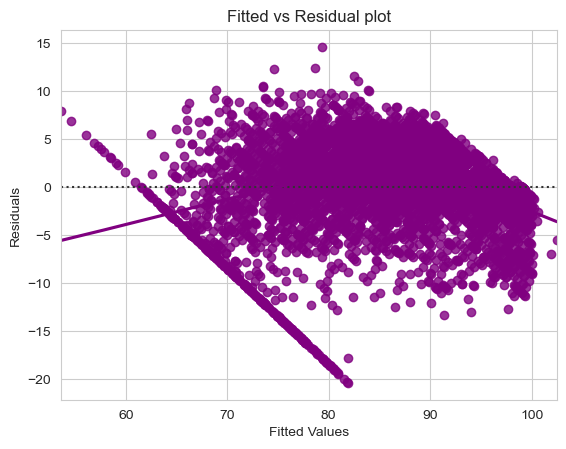

In [216]:
sns.set_style('whitegrid')
sns.residplot(
            data = df_pred, x ='Fitted Values', y ='Residuals', color = 'purple', lowess = True)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Fitted vs Residual plot')
plt.show()

In [217]:
X_trainst.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'pgscan', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

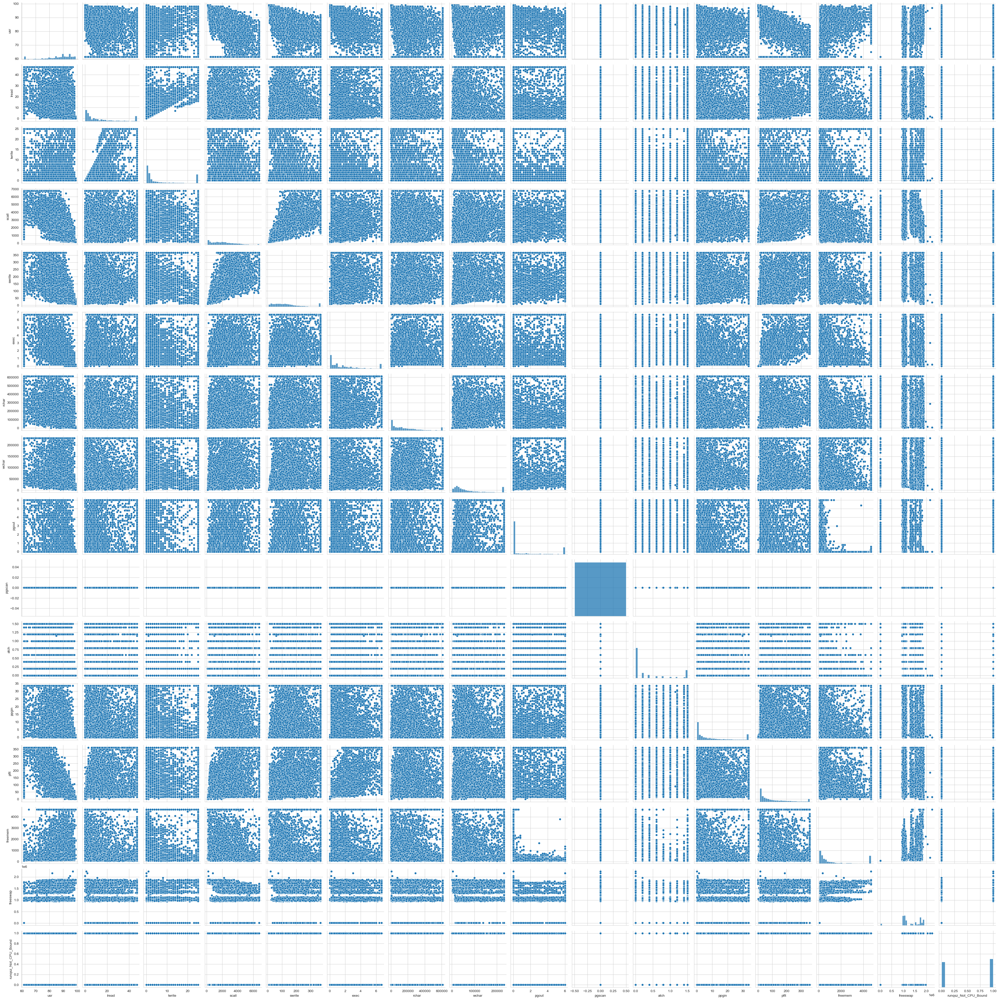

In [218]:
sns.pairplot(df[['usr','lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'pgscan', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound']])
plt.show()

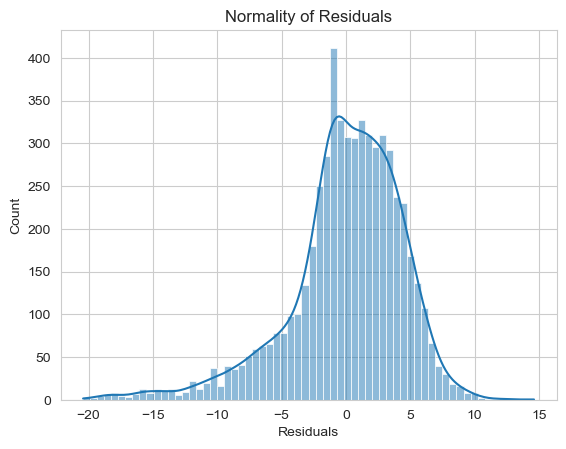

In [219]:
sns.histplot(df_pred['Residuals'],kde = True)
plt.title('Normality of Residuals')
plt.show()

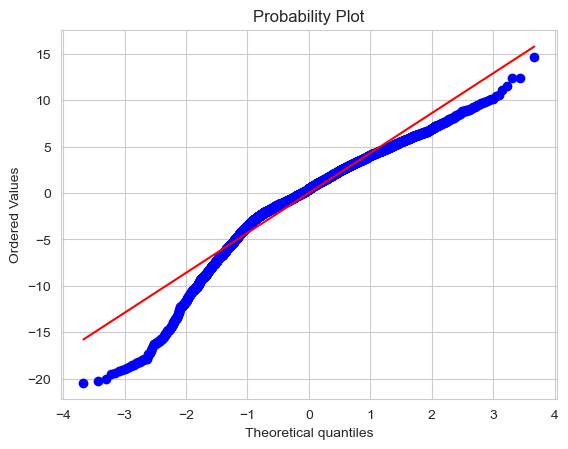

In [220]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred['Residuals'],dist='norm',plot=pylab)
plt.show()

In [224]:
stats.shapiro(df_pred['Residuals'])

ShapiroResult(statistic=0.9422687888145447, pvalue=1.2625699163566602e-42)

In [225]:
#test for Homoscedasticity

In [226]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [227]:
name = ['F statistics','p-value']
test = sms.het_goldfeldquandt(df_pred['Residuals'],X_trainst)
lzip(name,test)

[('F statistics', 1.118520513184377), ('p-value', 0.0013959368769108644)]

In [228]:
#since p_value >0.05, we can say that residuals are homoscedastic

In [229]:
print(olsres_35.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1588.
Date:                Sat, 20 May 2023   Prob (F-statistic):               0.00
Time:                        10:00:36   Log-Likelihood:                -16668.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5719   BIC:                         3.346e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0589 

# PREDICTTION

In [230]:
olsres_35.params

const                   8.405886e+01
lread                  -6.610097e-02
lwrite                  5.006105e-02
scall                  -6.661023e-04
swrite                 -5.801233e-03
exec                   -3.583369e-01
rchar                  -5.319530e-06
wchar                  -4.868165e-06
pgout                  -3.428716e-01
pgscan                  3.700094e-14
atch                    5.981612e-01
ppgin                  -6.081113e-02
pflt                   -3.977101e-02
freemem                -4.717098e-04
freeswap                8.934956e-06
runqsz_Not_CPU_Bound    1.601689e+00
dtype: float64

In [231]:
Equation = 'usr ='
print(Equation, end = '')
for i in range(len(X_trainst.columns)):
    if i ==0:
        print(olsres_35.params[i], "+", end = '')
    elif i != len(X_trainst.columns) - 1:
        print(
                olsres_35.params[i],
                '* (',
                X_trainst.columns[i],
                ')',
                '+',
                    end = '',
              )
    else:
            print(olsres_35.params[i],"*(",X_trainst.columns[i],")")

usr =84.05885820021479 +-0.06610096665594434 * ( lread ) +0.050061050420651426 * ( lwrite ) +-0.000666102310045097 * ( scall ) +-0.005801232696896429 * ( swrite ) +-0.35833686049916946 * ( exec ) +-5.319529814407689e-06 * ( rchar ) +-4.868164698295671e-06 * ( wchar ) +-0.34287161490627494 * ( pgout ) +3.7000936304617694e-14 * ( pgscan ) +0.5981612303938246 * ( atch ) +-0.06081112585951888 * ( ppgin ) +-0.03977101437962635 * ( pflt ) +-0.00047170977883319786 * ( freemem ) +8.934955639920427e-06 * ( freeswap ) +1.6016894476807697 *( runqsz_Not_CPU_Bound )


In [232]:
X_trainst.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'pgscan', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [233]:
X_testst.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_CPU_Bound',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [234]:
X_testst2 = X_testst.drop(['sread', 'fork', 'ppgout','pgfree','pgin','vflt','runqsz_CPU_Bound'], axis = 1)

In [235]:
y_pred = olsres_35.predict(X_testst2)

In [242]:
rmse1 = np.sqrt(mean_squared_error(y_trainst,df_pred['Fitted Values']))
print('RMSE for training data:',rmse1)

RMSE for training data: 4.427609531219266


In [243]:
rmse2 = np.sqrt(mean_squared_error(y_testst,y_pred))
print('RMSE for testing data:',rmse2)

RMSE for testing data: 4.669226210124628


In [244]:
mae1 = mean_absolute_error(y_trainst,df_pred['Fitted Values'])
print('MAE for training data:',mae1)

MAE for training data: 3.290484756713577


In [245]:
mae2 = mean_absolute_error(y_testst , y_pred)
print('MAE for testing data:',mae2)

MAE for testing data: 3.388463535364986
